# Business Overview

## Context
As the second-largest provider of carbohydrates in Africa, cassava is a key food security crop grown by smallholder farmers because it can withstand harsh conditions. At least 80% of household farms in Sub-Saharan Africa grow this starchy root, but viral diseases are major sources of poor yields. With the help of data science, it may be possible to identify common diseases so they can be treated.

In this competition, we introduce a dataset of 21,367 labeled images collected during a regular survey in Uganda. Most images were crowdsourced from farmers taking photos of their gardens, and annotated by experts at the National Crops Resources Research Institute (NaCRRI) in collaboration with the AI lab at Makerere University, Kampala. This is in a format that most realistically represents what farmers would need to diagnose in real life.

## Problem
Existing methods of disease detection require farmers to solicit the help of government-funded agricultural experts to visually inspect and diagnose the plants. This suffers from being labor-intensive, low-supply and costly. As an added challenge, effective solutions for farmers must perform well under significant constraints, since African farmers may only have access to mobile-quality (relatively inexpensive) cameras with low-bandwidth.

## Objective
The objective is to distinguish between several diseases that cause material harm to the food supply of many African countries. In some cases the main remedy is to burn the infected plants to prevent further spread, which can make a rapid automated turnaround quite useful to the farmers.

More precisely, the objective is to classify each cassava image into four disease categories or a fifth category indicating a healthy leaf. With this help, farmers may be able to quickly identify diseased plants, potentially saving their crops before they inflict irreparable damage.

# Dataset Overview
The data source comes from [Kaggle](https://www.kaggle.com/c/cassava-leaf-disease-classification).

There are 4 folders:

- **test_images**: contains images that have to be classified.
- **test_tfrecords**: contains files storing a sequence of preprocessed test images converted into TensorFlow files.
- **train_images**: contains 21397 images that are classified and used for predicting the disease in the the test set.
- **train_tfrecords**: contains 16 files storing a sequence of preprocessed train images converted into TensorFlow files.

The file **train.csv** contains the following columns:

- **image_id**: the image file name where all images are in JPG format.
- **label**: the ID code for the disease.

The file **label_num_to_disease_map.json** contains the mapping between each disease code and the real disease name.

In [1]:
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/MyDrive/Colab\ Notebooks/
PATH = "/content/drive/MyDrive/Colab\ Notebooks/"

import tensorflow as tf
from tensorflow.keras import layers, models

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.image import imread

import csv
import random
import collections
import json

from tensorflow.python.client import device_lib
device_lib.list_local_devices()

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/MyDrive/Colab Notebooks


[name: "/device:CPU:0"
 device_type: "CPU"
 memory_limit: 268435456
 locality {
 }
 incarnation: 6574314896843975825, name: "/device:GPU:0"
 device_type: "GPU"
 memory_limit: 11345264640
 locality {
   bus_id: 1
   links {
   }
 }
 incarnation: 12188940493528848249
 physical_device_desc: "device: 0, name: Tesla K80, pci bus id: 0000:00:04.0, compute capability: 3.7"]

# Data Exploration
In this section, the objective is to look at examples for every type of disease and examples of a healthy cassada. The possible categories are:

0. Cassava Bacterial Blight (CBB) 
1. Cassava Brown Streak Disease (CBSD)
2. Cassava Green Mottle (CGM)
3. Cassava Mosaic Disease (CMD)
4. Healthy

Then we look at the frequency of each category in our train set in order to have an idea on which one is more frequent and which one is less frequent.




{'Cassava Bacterial Blight (CBB)': 1087, 'Cassava Brown Streak Disease (CBSD)': 13158, 'Cassava Green Mottle (CGM)': 2189, 'Cassava Mosaic Disease (CMD)': 2386, 'Healthy': 2577}


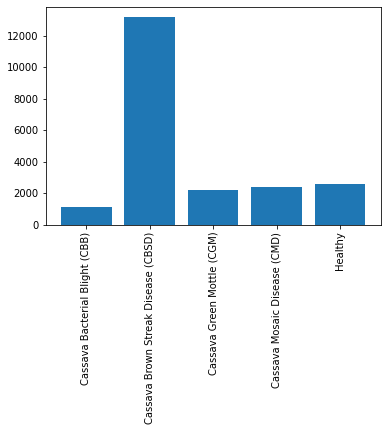

There are 21397 images in the training data set.


In [2]:
def read_csv_in_dataset(filename):
    with open(filename, newline='', ) as csv_file:
        dataset = csv.reader(csv_file)
        next(dataset)
    
        return np.array(list(dataset))

def extract_label_names(filename):
    with open(filename) as file_data:
        json_data = json.load(file_data)
        label_names = list(json_data.values())
        
        return label_names

# Column 0: image filename
# Column 1: labels
dataset = read_csv_in_dataset("Dataset/train.csv")
labels = dataset[:, 1]
labels_length = len(labels)
label_names = extract_label_names("Dataset/label_num_to_disease_map.json")

categories_frequency = dict(collections.Counter(labels))
categories_frequency = dict(zip(label_names, list(categories_frequency.values())))
print(categories_frequency)

plt.bar(*zip(*categories_frequency.items()))
plt.xticks(rotation='vertical')
plt.show()

print("There are {:d} images in the training data set.".format(labels_length))

Let's check the dimensions of the images in the _train_images_ folder:

In [3]:
import imagesize

img_shapes = {}
for row in dataset:
    width, height = imagesize.get("Dataset/train_images/" + row[0])
    img_shapes[(width, height)] = img_shapes.get((width, height), 0) + 1
    
print(img_shapes)

{(800, 600): 21397}


We show 5 randoms downscaled images for every label (from 0 to 4).

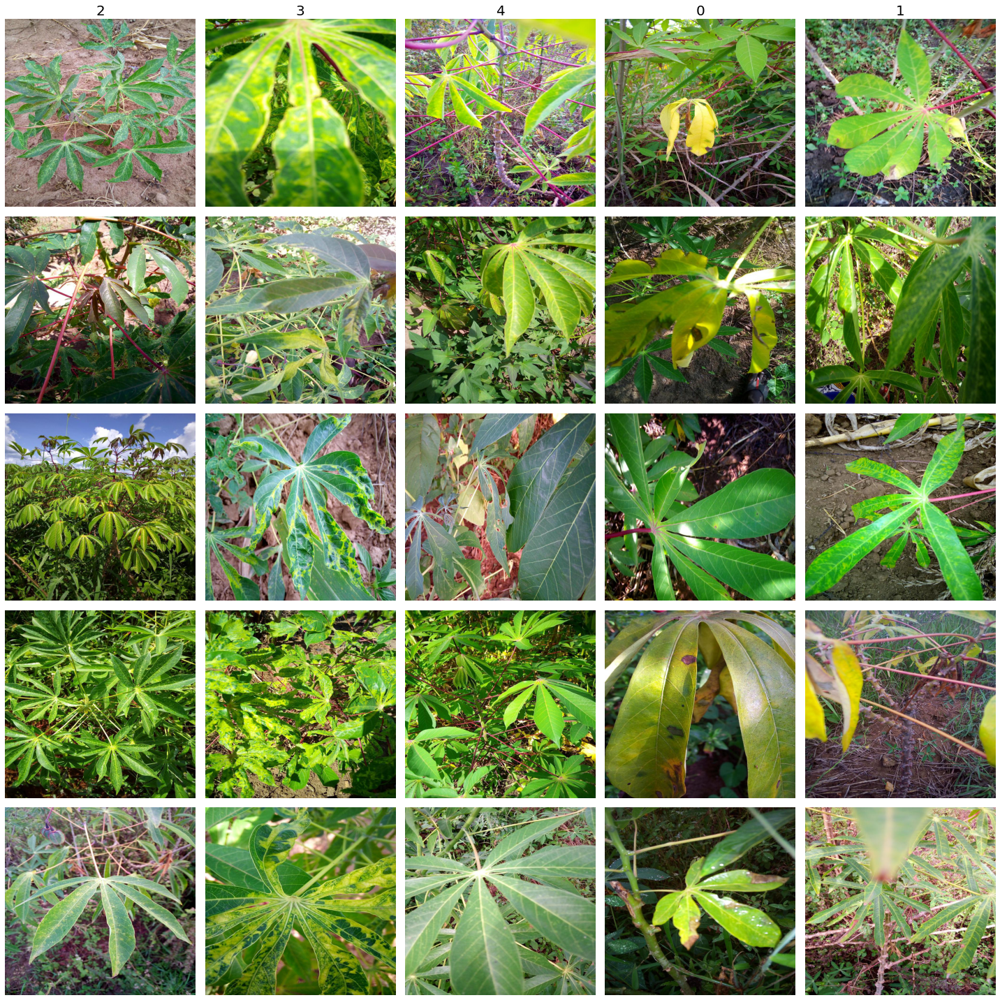

In [ ]:
# The objective is to obtain a dictionary where the key is the label and 
# the value is a list of filenames linked to the label.
SAMPLE_SIZE = 5
labels = list(set(labels))
dataset_by_label = {label: random.sample(["Dataset/train_images/" + row[0] for row in dataset if row[1] == label], SAMPLE_SIZE) for label in labels}

fig, axes = plt.subplots(nrows=SAMPLE_SIZE, ncols=SAMPLE_SIZE, figsize=(20, 20))
for ax, col in zip(axes[0,:], dataset_by_label.keys()):
    ax.set_title(col, size=20)

for label, filenamelist in dataset_by_label.items():
    i = list(dataset_by_label.keys()).index(label)
    for j, filename in enumerate(filenamelist):
        image = imread(filename)
        axes[j, i].axis("off")
        axes[j, i].imshow(image, cmap="gray", aspect="auto")

fig.tight_layout()
plt.subplots_adjust(wspace=.05, hspace=.05)
plt.show()

# Convolutional Neural Network
We are interested by the cassavas' leaves. However, there is noise on many images like:
- Human's shadow;
- Earth of different tones of brown;
- Humans;
- The sky;
- Other plants that are not cassavas.

Analysing the entire images will not be effective because we only need small portion of the images representing the cassavas' leaves where the disease appears. The other portions are considered as noise and must be excluded. We are then left with only the cassavas. With few images, the human eyes can detect the differences between each label:
0. There are generally some brown spots (wounds) on the leaves.
1. The veins (mainly secondary veins) of the cassavas are yellow or brown. Or, dark brown areas within the tuber.
2. There are many light-green or yellow-green spots on the leaves.
3. There is a yellow (or yellow-green) area representing sort of mozaic on the leaves.
4. The leaves are green with no significant change of color.

However, we did inspect few images before being able to tell which disease it was. We saw a pattern in the first images and learned how to classify those images. We use the **Convolutional Neural Network (CNN)** because this algorithm is efficient and it classifies images with higher accuracy. The CNN consists of the following main phases given an input image:
1. **Feature learning**  
    (a) Convolution layer(s);  
    (b) Detector layer(s) (Nonlinearity);  
    (c) Pooling layer(s);
2. **Classification**  
    (a) Flattening layer;  
    (b) Fully connected layer­;  
    (c) Softmax.

Example of a 3-covolution-layer CNN where $f$ is the size of the kernel, $s$ is the stride and $p$ is the zero-padding applied:
<img src="https://drive.google.com/uc?export=view&id=1NS0UxDuLNbiKk1Rp50oQ6qDe_mCuW6JD"/>

Image source: https://indoml.com/2018/03/07/student-notes-convolutional-neural-networks-cnn-introduction/ 


## Image Definitions and Notations
An image is described by its height $h$, its width $w$ and a matrix $w \times h$ of pixels. All images of the dataset have **3-colour channels** which means that those images are **RGB (Red Green Blue)** images. Every pixel in those images contains 3 values: one for each of the 3 colors. Each of these colors are represented by a 8-bit unsigned integer (between $0$ and $255$ inclusively). It follows that an image is represented as a 3-dimensional array $(w \times h \times d)$ where the depth is $d = 3$ for a RGB image. 

In mathematical notations, we define a RGB image as 3 stacked matrices (one per color):
$$
I_r = \begin{bmatrix} 
          r_{0, 0} & r_{0, 1} & \ldots & r_{0, w-1} \\ 
          r_{1, 0} & r_{1, 1} & \ldots & r_{1, w-1} \\ 
          \vdots & \vdots & \ddots & \vdots \\
          r_{h-1, 0} & r_{h-1, 1} & \ldots & r_{h-1, w-1}
      \end{bmatrix};
I_g = \begin{bmatrix} 
          g_{0, 0} & g_{0, 1} & \ldots & g_{0, w-1} \\ 
          g_{1, 0} & g_{1, 1} & \ldots & g_{1, w-1} \\ 
          \vdots & \vdots & \ddots & \vdots \\
          g_{h-1, 0} & g_{h-1, 1} & \ldots & g_{h-1, w-1}
      \end{bmatrix};
I_b = \begin{bmatrix} 
          b_{0, 0} & b_{0, 1} & \ldots & b_{0, w-1} \\ 
          b_{1, 0} & b_{1, 1} & \ldots & b_{1, w-1} \\ 
          \vdots & \vdots & \ddots & \vdots \\
          b_{h-1, 0} & b_{h-1, 1} & \ldots & b_{h-1, w-1}
      \end{bmatrix} 
$$
where $r$ stands for _red_, $g$ for _green_ and $b$ for _blue_. So, the pixel located at the point $(0, 0)$ on the image is $(r_{0,0}, g_{0,0}, b_{0,0})$. We use the notation $I_r(x,y)$ to get the value of the red color located at the point $(x, y)$ on the image $I$. 

## CNN Global Definitions and Notations
A CNN __layer__ is defined as the combination of a convolution layer and the pooling layer. A fully-connected layer and final layer are also considered as CNN layers. We note $\mathcal{N}$ the set of CNN layers. For example, if my CNN contains:
- Convolution Layer 1;
- Pooling Layer 1;
- Convolution Layer 2;
- Pooling Layer 2;
- Fully-connected Layer 1;
- Final Layer 1,

then my CNN contains $4$ CNN layers ($\mathcal{N} = \{1, 2, 3, 4\}$). The reason it is split in that way is because it is easier and less confusing to know what is the input and the output of a layer in terms of notations. 

In order to avoid using many variables to measure the length of different sets or vectors, we use the length function $L(\cdot)$ which takes any vector or set and returns its length. For example, $L(\mathcal{N}) = 4$.

As we know, the main objective is to classify images to their respective label. Let $\Lambda = \{0, 1, 2, 3, 4\}$ be the set of labels. It follows that the final output of the CNN is a vector of $5$ probabilities for each image to train: one probability for every label in $\Lambda$. The CNN takes a dataset of training images as input. This a high-level perspective because we have to consider providing __hyperparameters__ in the different CNN layers.

## Convolution Layers
https://cs231n.github.io/convolutional-networks/

https://insightsimaging.springeropen.com/articles/10.1007/s13244-018-0639-9

<img src="https://drive.google.com/uc?export=view&id=1QynpQuPuRfOsf_F_nhD91iZeyb1TUaro"/>

Image source: https://indoml.com/2018/03/07/student-notes-convolutional-neural-networks-cnn-introduction/ 

### Definitions and Notations
Each convolution layer holds the pixel values of the input image in order to **extract features** from it such as edges, color, gradient orientation and magnitude, etc. The convolution layer ensures the spatial relationship between pixels by learning image features using features detectors called __filters__ that are adapted by a learning algorithm used in the backward propagation phase. 

A CNN can have 1 to many convolution layers. A convolution layer generally starts a CNN. We note $\mathcal{C}_i$ a convolution layer where $i$ starts at $0$ and is the index representing the $i^{th}$ CNN layer. 

We define a vector of __feature maps__ as the input or output of a convolution layer $\mathcal{C}_i$. It is represented as a 3-dimensional array noted $\mathcal{F}_i$ and is of size $w_{i} \times h_{i} \times d_{i}$ where:
- $w_{i}$ is the __width__ of the feature map of the CNN layer $i$.
- $h_{i}$ is the __height__ of the feature map of the CNN layer $i$.
- $d_{i}$ is the __depth__ of the feature map of the CNN layer $i$.

For example, a RGB image contains 3 stacked-2-dimensional feature maps where $d_{i} = 3$. If we want the value in $(x, y)$ of the $j^{th}$ feature map, this is noted $\mathcal{F}_{i,j}(x, y)$.

We define a __kernel__ as a 2-dimensional array (matrix) noted $\mathcal{K}_{i, j, k}$ which is the $k^{th}$ kernel of the $j^{th}$ filter of the $i^{th}$ CNN layer. Then, we define a __filter__ as the vector of kernels (or 2-dimensional-stacked kernels) noted $\mathcal{K}_{i,j}$. The number of filters always equal to the number of feature maps in the next CNN layer. A kernel is of dimension $\omega_{i,j,k} \times \eta_{i,j,k}$ where:
- $\omega_{i,j,k}$ is the number of row number of the matrix.
- $\eta{i,j,k}$ is the number of column of the matrix.

A kernel is expressed as:
$$
\mathcal{K}_{i,j,k} = \begin{bmatrix} 
          a_{0, 0} & a_{0, 1} & \ldots & a_{0, \eta_{i,j,k}-1} \\ 
          a_{1, 0} & a_{1, 1} & \ldots & a_{1, \eta_{i,j,k}-1} \\ 
          \vdots & \vdots & \ddots & \vdots \\
          a_{\omega_{i,j,k}-1, 0} & a_{\omega_{i,j,k}-1, 1} & \ldots & a_{\omega_{i,j,k}-1, \eta_{i,j,k}-1}
      \end{bmatrix}.
$$
The values in $\mathcal{K}_{i,j,k}$ are called __weights__. In our case, we will use a square matrice of odd dimension. So, we set $\omega_{i,j,k} = \eta_{i,j,k}$ odd and for all $j,k$ to retain the symmetry of the image. 

Each convolution layer $\mathcal{C}_i$ takes as input feature maps $\mathcal{F}_i$ (which is the training image $\mathcal{F}_0$ in the initial convolution layer $\mathcal{C}_0$) and filters represented as 3-dimensional arrays noted $\mathcal{K}_{i}$.

### Biological Associations
<img src="https://drive.google.com/uc?export=view&id=1aVRmsHF4EoKsWVYSHoCGR4FYfyxYjdva"/>

Image source: https://cs231n.github.io/neural-networks-1/

Suppose that we have a RGB image of size $800 \times 600$ which gives $480000$ RGB pixels and that we want to use 5 filters of size $3 \times 3 \times 3$. Also, assume a stride $s = 1$ and no zero-padding added. 

A __neuron__ consists of a cell body (soma), dentrites and an axon. The number of neurons is determined by the number of times the kernel moves on the input image. In this example, we have:
$$
\begin{align*}
    Neurons &= (800 - 3 + 1) \times (600 - 3 + 1) \times 5 \\
    &= 798 \times 598 \times 5 \\
    &= 2386020.
\end{align*}
$$

The __synapse__ is the connection between 2 neurons where the signal of a neuron is transmitted to another connected neuron. Its strength is determined by a kernel weight. The number of synapses per neuron is determined by the number of connected neurons when a kernel is applied over the image. This is represented by the number of weights in a kernel. In our example, we have $3 \times 3 \times 3 \times 5 = 135$ synapses per neuron. 

The __dentrites__ carry the input signal to the cell body. They are represented by the dot product between a weight of a kernel and a pixel of an image. 

The __cell body__ sums the signals carried by the dentrites represented by the product between a kernel weight and an image pixel. This is the convolution operation performed between the kernel and a region of the image located at position $(x, y)$.

The __axon__ conducts the signal away from the cell body. If that signal voltage is above a certain threshold (measured by an activation function), the neuron fires a spike along the axon. This can be represented by the ReLU activation function applied on the result of the convolution obtain in the cell body.


### How many convolution layers should we use in the CNN?
The number of convolution layers depends on how deep we want to specialize our features detectors. This leads to the main objective which is to specialize enough deeper the features detectors to ensure that with the most specialized features detectors, the algorithm identifies accurately to which label the image is classified. This means that if we have an image of a dog and the possible labels are *cat* and *dog*, detecting if the animal in the image has eyes and a nose is clearly not enough specialized to classify it because cats and dogs have both these features.

***Example***

Suppose that we want to identify in an image a bacterial blight on a cassava. We could set the following layers:
- **Initial layer**: Detect the edges of each feature (objects in the image) with their color. 
- **Second layer**: Detect only cassavas from the image returned by the initial layer. Thus, we filter out all features that are not cassavas. 
- **Third layer**: Detect only the cassava's leaves from the image returned by the second layer (filter out all features that are not cassava's leaves since the disease is located on the leaves). 
- **Fourth layer**: Detect the brown spots on the cassava's leaves from the image returned by the third layer. 

In this example, there are $4$ levels of deepness ($\mathcal{C}_0, \mathcal{C}_1, \mathcal{C}_2, \mathcal{C}_3$). More we need to specialize in the detection, deeper is the learning. Since we are looking at brown spots on the cassava's leaves, we have to ensure that those brown spots are the feature that differentiates the bacterial blight from the other possible classification.

### How many filters should we use per convolution layer?
The objective of the kernel is to filter an area of the input image in order to act as a detector of specific features by moving the kernel accross the image area. **Deeper the learning (specialization) is, larger is the number of filters** because more precise details are required.

The objective of the initial convolution layer is generally to extract the edges, the colors, the orientation of the training image. These high-level image properties can be extracted with a smaller number of filters. For example, if the input is a 3-channel image, then we could use $8$ filters (each containing 3 kernels because the image depth is $3$) to start with and then increase this number on the subsequent convolution layer.

The subsequent convolution layers has the purpose of specializing the features detectors. In our case, to classify an image where the cassava has a bacterial blight by detecting the brown spots on the cassava's leaves, we need more filters because the features we need are located in more precise areas on the image. Therefore, a filter could be used only on a specific area of the image (e.g. the leaves). This means that many filters could by used on the same image. Generally, we increase the number of filters by a power of $2$ per convolution layer (e.g. $8, 16, 32, 64, \ldots$).

### How are filters initialized?
Since the filters from the subsequent convolution layers learn from the previous ones, we have to initialize the filters $\mathcal{K}_{0}$ for the initial convolution layer $\mathcal{C}_0$.

Each value of an initial 3-dimensional filter $\mathcal{K}_{0, j}$ is initialized with the 3-dimensional-centered Gaussian distribution according to [the multivariate Gaussian distribution](http://cs229.stanford.edu/section/gaussians.pdf):
$$
\mathcal{K}_{0,j,k}(l, m) = \frac{1}{\left(\sqrt{2\pi} \sigma\right)^3} \exp{\left(-\frac{(k - \rho_{0})^2 + (l - \rho_{0})^2 + (m - \rho_{0})^2}{2\sigma^2}\right)}
$$
for all $0 \leq l,m \leq \omega_{i, j, k} - 1$ and $0 \leq k < L(\mathcal{K}_{0,j})$ where the standard deviation is $\sigma = \sqrt{\frac{2}{j}}$ for all $0 \leq j < L(\mathcal{K}_{0})$ and $\rho_{0}$ is the zero-padding added to the initial filters.

### What should the size of kernels be?
The kernels size is an __hyperparameter__ of the convolution layer and is typically $3 \times 3$, $5 \times 5$ or $7 \times 7$.

For the initial layer $\mathcal{C}_0$, we could use kernels of larger size like $5 \times 5$ for example. The kernels size is larger on the initial convolution layer because we only extract larger features from the input image. For the subsequent layers, the kernels size could be $3 \times 3$ because we need more precise details on the input image and this is more efficient. If the size is increased, the number of parameters (values in the kernels) increases quadratically. So, we filter the input image with smaller pieces of image instead.

### Zero Padding
In the forward and backward propagations, the convolution operation takes 2 input matrices and returns an output a matrix. Suppose that those 2 matrices are the input feature map $\mathcal{F}_{i,k}$ and the kernel $\mathcal{K}_{i,j,k}$.

The convolution between $\mathcal{F}_{i,k}$ and $\mathcal{K}_{i,j,k}$ can be applied in 3 different modes:
- **Valid-Padding Mode**: There is no zero-padding added. The size of the output feature map is reduced compared to the size of the input feature map. 
- **Same-Padding Mode**: There is a zero-padding added. The size of the output feature map is the same as the size of the input feature map.
- **Full-Padding Mode**: There is a zero-padding added. The size of the output feature map is the increased compared to the size of the input feature map.

<img src="https://drive.google.com/uc?export=view&id=1BhuSAuw879igQad_AUapdvlAi4WfE6Vq"/>

Image source: https://github.com/tynowell/rotdetection-CNN/blob/master/Detection%20and%20Quantification%20of%20Rot%20in%20Harvested%20Trees%20using%20Convolutional%20Neural%20Networks.pdf

We note $\rho_i$ the zero-padding added to the feature map of the CNN layer $i$.

**Valid-padding Mode**

Since the zero-padding is not applied ($\rho_i = 0$), then the output feature map is of size $w_{i} - \omega_{i,j,k} + 1 \times h_{i} - \omega_{i,j,k} + 1$. In the example of a feature map of size $34 \times 34$ and a kernel of size $7 \times 7$, the output feature map is of size $28 \times 28$.

The top-left value of $\mathcal{K}_{i,j,k}$ which is $\mathcal{K}_{i,j,k}(0, 0)$ is used over the value of $\mathcal{F}_{i,k}(0, 0)$ as the starting point of the convolution.

**Same-padding Mode**

Since the result of the convolution operation is a reduced-size feature map, we add the **zero-padding hyperparameter** in order to preserve the size of the input feature map to not lose any of its information. To preserve these spacial dimensions, we add
$$
\rho_i = \frac{\omega_{i,j,k} - 1}{2} \in \mathbb{N}_*
$$
columns of zeros at the left, right, top and bottom of the input feature map because $\omega_{i,j,k}$ is odd and we use the centre value of $\mathcal{K}_{i,j,k}$ which is $\mathcal{K}_{i,j,k}(\rho_i + 1, \rho_i + 1)$ over the value of $\mathcal{F}_{i,k}(0, 0)$ as the starting point of the convolution. 

For example, if the kernel size is $7 \times 7$ and is convolved on an input feature map of size $34 \times 34$, then there are $\rho_i = \frac{7 - 1}{2} = 3$ columns of zeros added at the left and right of the feature map, and $3$ rows of zeros added at the top and bottom of the feature map. Therefore, the feature map size increased to $40 \times 40$. After the convolution operation, the output feature map is of size $34 \times 34$. See the [dynamic convolution demo](https://cs231n.github.io/convolutional-networks/) where the Same-padding mode is applied.

**Full-padding Mode**

Instead of starting with $\mathcal{K}_{i,j,k}(0, 0)$ or $\mathcal{K}_{i,j,k}(\rho_i + 1, \rho_i + 1)$ over the value of $\mathcal{F}_{i,k}(0, 0)$, the value $\mathcal{K}_{i,j,k}(\omega_{i,j,k} - 1, \omega_{i,j,k} - 1)$ is used. Thus, we add $\rho_i = \omega_{i,j,k} - 1$.

### Stride
The stride used in the convolution layer $\mathcal{C}_i$ noted $s_i$ is an **hyperparameter** that defines the right and down shifting distance of the kernel over the feature map per iteration. It controls the spacial dimensions of the resulting feature maps (size divided by $s_i$).

An example with a stride $s_i = 1$:

<img src="https://drive.google.com/uc?export=view&id=11kcFC6Gh9GsopoqD7ehgKl46nvO2B5nZ"/>

An example with a stride $s_i = 2$:

<img src="https://drive.google.com/uc?export=view&id=1JW8f0tWsQ_Ji-xo2bEeHLc95bG6YrFl4" width=300 height=300 />

Images source: https://towardsdatascience.com/a-comprehensive-guide-to-convolutional-neural-networks-the-eli5-way-3bd2b1164a53

### Forward Propagation

__Equations__

The convolution operator noted $*$ is defined for a 2-dimensional feature map at point $(x, y)$ and a kernel (as we defined) as:
$$
(\mathcal{K}_{i,j,k} * \mathcal{F}_{i,k})(x, y) = \mathcal{B}_{i,j} + \sum\limits_{l = 0}^{\omega_{i,j,k} - 1} \sum\limits_{m = 0}^{\omega_{i,j,k} - 1} \mathcal{F}_{i,k}(x + l, y + m) \mathcal{K}_{i,j,k}(l, m)
$$
for all $0 \leq x \leq w_{i,k} - \omega_{i,j,k}$ and $0 \leq y < h_{i,k} - \omega_{i,j,k}$ and where $\mathcal{B}_{i,j} \in \mathbb{R}$ is the bias used with the filter $j$ in the CNN layer $i$. This equation has no zero-padding added and applies a stride $s_i = 1$.

If we add zero-padding and keep $s_i = 1$, we obtain the same equation but for all 
$$
\begin{gather*}
    0 \leq x \leq w_{i,k} - \omega_{i,j,k} + 2\rho_i \\ 
    0 \leq y \leq h_{i,k} - \omega_{i,j,k} + 2\rho_i.
\end{gather*}
$$
To avoid negative indices, we added zero-padding in the input feature map first and then start at $(0,0)$ on this zero-padded matrix.

If we add zero-padding and stride $s_i > 1$, we obtain the same equation and bounds on $x$ and $y$ except that $x \leftarrow x + s_i$ each time the kernel moves to the right over the feature map and $y \leftarrow y + s_i$ each time the kernel moves down over the feature map.

__Output Feature Map Dimensions__

The output feature map of the convolution layer $\mathcal{C}_i$ is a feature map $\mathcal{F}'_{i, k}$ of dimensions 
$$
\frac{w_{i, k} - \omega_{i,j,k} + 2\rho_i}{s_i} + 1 \times \frac{h_{i, k} - \omega_{i,j,k} + 2\rho_i}{s_i} + 1.
$$

For example, if $\mathcal{F}_{i,k}$ is of dimensions $34 \times 34$, the kernel $\mathcal{K}_{i,j,k}$ is of dimensions $5 \times 5$, the stride is $s_i = 3$ and the same-padding mode is applied, then the zero-padding is 
$$
\rho_i = \frac{5 - 1}{2} = 2
$$
and the output feature map $\mathcal{F}'_{i, k}$ is of size $\frac{34 - 5 + 4}{3} + 1 \times \frac{34 - 5 + 4}{3} + 1$ hence $12 \times 12$.

__Generalization to Filters (Stacked Kernels)__

To calculate directly with a filter $\mathcal{K}_{i,j}$, we sum the 2-dimensional convolution results:
$$
(\mathcal{K}_{i,j} * \mathcal{F}_{i})(x, y) = \mathcal{B}_{i,j} + \sum\limits_{k = 0}^{L(\mathcal{K}_{i,j}) - 1} \sum\limits_{l = 0}^{\omega_{i,j,k} - 1} \sum\limits_{m = 0}^{\omega_{i,j,k} - 1} \mathcal{F}_{i,k}(x + l, y + m) \mathcal{K}_{i,j,k}(l, m).
$$
See the [dynamic convolution demo](https://cs231n.github.io/convolutional-networks/) for a 3-dimensional concrete example.

If we have many filters, the convolution operation applies on each filter to form stacked matrices or equivalently a 3-dimentional output:
<img src="https://drive.google.com/uc?export=view&id=1ciqnphBcG-7ROzhCIaXM45MAfQg3V_2O"/>

Image source: https://indoml.com/2018/03/07/student-notes-convolutional-neural-networks-cnn-introduction/ 

**Example**

Let's define a $3 \times 3 \times 3$ filter as 3 stacked kernels in the first CNN layer:
$$
\mathcal{K}_{0,0,0} = \begin{bmatrix} 
          -1 & -1 & 1 \\ 
          0 & 1 & -1 \\ 
          0 & 1 & 1
    \end{bmatrix};
\mathcal{K}_{0,0,1} = \begin{bmatrix} 
          1 & 0 & 0 \\ 
          1 & -1 & -1 \\ 
          1 & 0 & -1
    \end{bmatrix};
\mathcal{K}_{0,0,2} = \begin{bmatrix} 
          0 & 1 & 1 \\ 
          0 & 1 & 0 \\ 
          1 & -1 & 1
    \end{bmatrix}
$$
and a $3 \times 3 \times 3$ RGB image defined as 3 stacked feature maps (including the zero-padding):
$$
\mathcal{F}_{0,0} = \begin{bmatrix} 
          0 & 0 & 0 & 0 & 0 \\
          0 & 156 & 155 & 156 & 0 \\ 
          0 & 153 & 154 & 157 & 0 \\
          0 & 149 & 151 & 155 & 0 \\
          0 & 0 & 0 & 0 & 0 
      \end{bmatrix};
\mathcal{F}_{0,1} = \begin{bmatrix} 
          0 & 0 & 0 & 0 & 0 \\
          0 & 167 & 166 & 167 & 0 \\ 
          0 & 164 & 165 & 168 & 0 \\
          0 & 160 & 162 & 166 & 0 \\
          0 & 0 & 0 & 0 & 0 
      \end{bmatrix};
\mathcal{F}_{0,2} = \begin{bmatrix} 
          0 & 0 & 0 & 0 & 0 \\
          0 & 163 & 162 & 163 & 0 \\ 
          0 & 160 & 161 & 164 & 0 \\
          0 & 156 & 158 & 162 & 0 \\
          0 & 0 & 0 & 0 & 0 
      \end{bmatrix}.
$$
The same-padding mode is applied where $\rho_0 = \frac{3-1}{2} = 1$, the stride $s_0 = 1$ and no biases ($\mathcal{B}_{0,0} = 0$). For example, the convolution operations applied between $\mathcal{F}_{0,0}$ and $\mathcal{K}_{0,0,0}$ give:
$$
\begin{gather*}
    (\mathcal{F}_{0,0}*\mathcal{K}_{0,0,0})(0, 0) = -1 \cdot 0 + -1 \cdot 0 + 1 \cdot 0 + 0 \cdot 0 + 1 \cdot 156 + -1 \cdot 155 + 0 \cdot 0 + 1 \cdot 153 + 1 \cdot 154 = 308 \\
    (\mathcal{F}_{0,0}*\mathcal{K}_{0,0,0})(0, 1) = -1 \cdot 0 + -1 \cdot 0 + 1 \cdot 0 + 0 \cdot 156 + 1 \cdot 155 + -1 \cdot 156 + 0 \cdot 153 + 1 \cdot 154 + 1 \cdot 157 = 310 \\
    (\mathcal{F}_{0,0}*\mathcal{K}_{0,0,0})(0, 2) = -1 \cdot 0 + -1 \cdot 0 + 1 \cdot 0 + 0 \cdot 155 + 1 \cdot 156 + -1 \cdot 0 + 0 \cdot 154 + 1 \cdot 157 + 1 \cdot 0 = 313 \\
    (\mathcal{F}_{0,0}*\mathcal{K}_{0,0,0})(1, 0) = -1 \cdot 0 + -1 \cdot 156 + 1 \cdot 155 + 0 \cdot 0 + 1 \cdot 153 + -1 \cdot 154 + 0 \cdot 0 + 1 \cdot 149 + 1 \cdot 151 = 298 \\
    (\mathcal{F}_{0,0}*\mathcal{K}_{0,0,0})(1, 1) = -1 \cdot 156 + -1 \cdot 155 + 1 \cdot 156 + 0 \cdot 153 + 1 \cdot 154 + -1 \cdot 157 + 0 \cdot 149 + 1 \cdot 151 + 1 \cdot 155 = 148 \\
    (\mathcal{F}_{0,0}*\mathcal{K}_{0,0,0})(1, 2) = -1 \cdot 155 + -1 \cdot 156 + 1 \cdot 0 + 0 \cdot 154 + 1 \cdot 157 + -1 \cdot 0 + 0 \cdot 151 + 1 \cdot 155 + 1 \cdot 0 = 1 \\
    (\mathcal{F}_{0,0}*\mathcal{K}_{0,0,0})(2, 0) = -1 \cdot 0 + -1 \cdot 153 + 1 \cdot 154 + 0 \cdot 0 + 1 \cdot 149 + -1 \cdot 151 + 0 \cdot 0 + 1 \cdot 0 + 1 \cdot 0 = -1 \\
    (\mathcal{F}_{0,0}*\mathcal{K}_{0,0,0})(2, 1) = -1 \cdot 153 + -1 \cdot 154 + 1 \cdot 157 + 0 \cdot 149 + 1 \cdot 151 + -1 \cdot 155 + 0 \cdot 0 + 1 \cdot 0 + 1 \cdot 0 = -154 \\
    (\mathcal{F}_{0,0}*\mathcal{K}_{0,0,0})(2, 2) = -1 \cdot 154 + -1 \cdot 157 + 1 \cdot 0 + 0 \cdot 151 + 1 \cdot 155 + -1 \cdot 0 + 0 \cdot 0 + 1 \cdot 0 + 1 \cdot 0 = -156
\end{gather*}
$$
which is represented by the $3 \times 3$ matrix:
$$
(\mathcal{F}_{0,0}*\mathcal{K}_{0,0,0}) = \begin{bmatrix} 
          308 & 310 & 313 \\ 
          298 & 148 & 1 \\
          -1 & -154 & -156
      \end{bmatrix}.
$$
The other output feature maps are:
$$
(\mathcal{F}_{0,1}*\mathcal{K}_{0,0,1}) = \begin{bmatrix} 
          -498 & -170 & 164 \\ 
          -491 & -8 & 325 \\
          -322 & -9 & 161
      \end{bmatrix};
(\mathcal{F}_{0,2}*\mathcal{K}_{0,0,2}) = \begin{bmatrix} 
          164 & 325 & 160 \\ 
          487 & 646 & 323 \\
          477 & 483 & 326
      \end{bmatrix}.
$$
Adding the 3 convolution results gives the final result (before applying the activation function):
$$
\begin{align*}
    \mathcal{F}_{0}*\mathcal{K}_{0,0} &= (\mathcal{F}_{0,0}*\mathcal{K}_{0,0,0}) + (\mathcal{F}_{0,1}*\mathcal{K}_{0,0,1}) + (\mathcal{F}_{0,2}*\mathcal{K}_{0,0,2}) \\
    &= \begin{bmatrix} 
          -26 & 465 & 637 \\ 
          294 & 786 & 649 \\
          154 & 325 & 331
      \end{bmatrix}.
\end{align*}
$$

### Activation Function
Based on the neuron model, the activation function is firing a signal along the axon if that signal is above a certain threshold. The objective of the activation function in the CNN is the same. The activation function takes the output signal ($\mathcal{F}'_{i,k}$ in our case) calculated from the previous cell and if that signal is above a given threshold, that signal is taken as an input to the next cell.

<img src="https://drive.google.com/uc?export=view&id=1aVRmsHF4EoKsWVYSHoCGR4FYfyxYjdva"/>

Image source: https://cs231n.github.io/neural-networks-1/

In our case, we use the __Rectified Linear Unit (ReLU)__ function which is defined as:
$$
f(\mathcal{F}'_{i,k}) = \max(0, \mathcal{F}'_{i,k})
$$
where the threshold is $0$. Each negative value of the output feature map is replaced by $0$ in the fired output feature map. The derivative is a matrix of zeros and ones:
$$
    \frac{df(\mathcal{F}'_{i,k})}{d \mathcal{F}'_{i,k}}(x, y) = \begin{cases}
        0 \quad \text{if } \mathcal{F}'_{i,k}(x, y) \leq 0 \\
        1 \quad \text{if } \mathcal{F}'_{i,k}(x, y) > 0.
    \end{cases}
$$

To continue our example from the _Forward Propagation_ section, we apply the activation function to obtain:
$$
f(\mathcal{F}_{0}*\mathcal{K}_{0,0}) = \begin{bmatrix} 
          0 & 465 & 637 \\ 
          294 & 786 & 649 \\
          154 & 325 & 331
      \end{bmatrix}.
$$

In [3]:
import keras.backend as K

def kernel_init(shape, dtype=None):
    kernel = np.stack([[[-1, -1, 1],
            [0, 1, -1],
            [0, 1, 1]],
           [[1, 0, 0],
            [1, -1, -1],
            [1, 0, -1]],
           [[0, 1, 1],
            [0, 1, 0],
            [1, -1, 1]]], axis=-1)
    kernel = np.reshape(kernel, (3, 3, 3, 1))
    return K.variable(kernel, dtype='float32')

image = np.stack([[[156, 155, 156],
          [153, 154, 157],
          [149, 151, 155]],
         [[167, 166, 167],
          [164, 165, 168],
          [160, 162, 166]],
         [[163, 162, 163],
          [160, 161, 164],
          [156, 158, 162]]], axis=-1)
image = np.reshape(image, (-1, 3, 3, 3))

model = models.Sequential()
model.add(layers.Conv2D(filters=1,
                        kernel_size=(3, 3), 
                        kernel_initializer=kernel_init,
                        padding='same', 
                        activation='relu', 
                        input_shape=(3, 3, 3)))
model.summary()
model.predict(image)

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 3, 3, 1)           28        
Total params: 28
Trainable params: 28
Non-trainable params: 0
_________________________________________________________________


array([[[[  0.],
         [465.],
         [637.]],

        [[294.],
         [786.],
         [649.]],

        [[154.],
         [325.],
         [331.]]]], dtype=float32)

### Backward Propagation
https://arxiv.org/pdf/1412.6980.pdf

We assume that the initial filters $\mathcal{K}_{0, j}$ and biases $\beta_{0, j}$ of the initial convolution layer are known. As we know, to output a feature map, we need 3 input parameters:
- Filters (weights) $\mathcal{K}_{i}$;
- Input feature maps $\mathcal{F}_{i}$;
- Biases $\mathcal{B}_{i}$.

In order to find filters and biases of the subsequent convolution layers, we need:
- A loss function noted $\mathcal{L}$;
- The gradient of $\mathcal{L}$ with respect to the kernels weights;
- The gradient of $\mathcal{L}$ with respect to the biases;
- The gradient of $\mathcal{L}$ with respect to the input feature map;
- The learning algorithm that will update the weights and biases.

In the initial convolution layer, the input parameters are a training image $\mathcal{F}_0$ and a filters $\mathcal{K}_0$ where the weights are initialized by using gaussian distribution. The output feature map $\mathcal{F}_1$ is obtained from the **forward propagation**. 

However, we have to know if the weights we set in each kernel are accurate or have to be improved. In order to measure the accuracy of the weights, we need a loss function noted $\mathcal{L}$ that calculates the error between the ground truth data and the output result. The same loss function applies for the biases.

The objective is to minimize that loss function with the help of the stochastic gradient descend (SGD) algorithm by updating the weights and biases. These updates are determined by the gradients of $\mathcal{L}$ with respect to the weights and biases. These gradients tell us how much the weights and biases need to change to minimize the loss function $\mathcal{L}$.

#### Loss Function
In our case, each image has to be classified to one and only one label among $L(\Lambda)$ labels. Let: 
- $y = (y_0, y_1, \ldots, y_{L(\Lambda)-1})$ be the ground truth data vector.
- $\hat{y} = (\hat{y}_0, \hat{y}_1, \ldots, \hat{y}_{L(\Lambda)-1})$ be the predicted data vector.

Since there is one and only one label to which an image is classified, the ground truth data vector is:
$$
y = (0, 0, \ldots, 0, 1, 0, \ldots, 0)
$$
where $y(i) = 1$ at position $0 \leq i \leq L(\Lambda)-1$ and $y(j) = 0$ for all $j \neq i$. 

We use the **cross entropy loss function** defined as:
$$
\begin{align*}
    \mathcal{L}(y, \widehat{y}) &= -y \cdot \ln(\hat{y}) \\
     &= -\sum\limits_{i = 0}^{L(\Lambda)-1} y_i \ln(\hat{y}_i)
\end{align*}
$$
where the operator $\cdot$ denotes the inner product. 

In our case, $\mathcal{L}$ is function of the:
- Weights contained in each filter $\mathcal{K}_{i,j}$;
- Biases $\mathcal{B}_{i,j}$;
- Input feature maps $\mathcal{F}_{i}$;
- Desired output feature maps $\mathcal{F}'_{i}$.

We know that the output feature map is function of the weights, biases and input feature map. This is expressed as:
$$
\mathcal{F}'_{i} = \mathcal{F}_{i}*\mathcal{K}_{i} + \mathcal{B}_{i}
$$
where the convolution operator is performed on all filters in $\mathcal{K}_{i}$ to output the same number of feature maps as for the input feature maps.
So, we have:
$$
\begin{align*}
    \mathcal{L}(\mathcal{F}_{i}, \mathcal{F}'_{i}) &= -\mathcal{F}_{i} \otimes \ln(f(\mathcal{F}'_{i})) \\
    &= -\mathcal{F}_{i} \otimes \ln(f(\mathcal{F}_{i}*\mathcal{K}_{i} + \mathcal{B}_{i}))
\end{align*}
$$
where $\otimes$ is the element-wise multiplication.

**Loss Function Gradient**

The gradient of $\mathcal{L}$ in the CNN layer $i$ is expressed as:
$$
\nabla_i \mathcal{L} = \left(\frac{\partial\mathcal{L}}{\partial \mathcal{F}_{i}}, \frac{\partial\mathcal{L}}{\partial \mathcal{F}'_{i}}, \frac{\partial\mathcal{L}}{\partial \mathcal{K}_{i}}, \frac{\partial\mathcal{L}}{\partial \mathcal{B}_{i}}\right).
$$
The derivative of the loss function with respect to the output feature maps is given by:
$$
\frac{\partial\mathcal{L}}{\partial f(\mathcal{F}'_{i})} = -\left(\mathcal{F}_{i} \otimes \frac{df}{d\mathcal{F}'_{i}}\right) \oslash f(\mathcal{F}'_{i})
$$
where $\oslash$ is the element-wise division.

The other derivatives are calculated according to the derivative chain rule in the next sections. The chain rule for the filters is expressed as:
$$
\frac{\partial\mathcal{L}(\mathcal{F}_{i}, \mathcal{F}'_{i}(\mathcal{K}_{i}, \mathcal{B}_{i}))}{\partial \mathcal{K}_{i}} = \frac{\partial\mathcal{L}(\mathcal{F}_{i}, \mathcal{F}'_{i}(\mathcal{K}_{i}, \mathcal{B}_{i}))}{\partial \mathcal{F}'_{i}(\mathcal{K}_{i}, \mathcal{B}_{i})} \frac{\partial\mathcal{F}'(\mathcal{K}_{i}, \mathcal{B}_{i})}{\partial \mathcal{K}_{i}}.
$$

#### Weights gradient
We define the derivative of $\mathcal{L}$ with respect to a kernel $\mathcal{K}_{i,j,k}$ as the Jacobian matrix:
$$
\nabla_{\mathcal{K}_{i,j,k}} \mathcal{L} = \begin{bmatrix} 
          \frac{\partial \mathcal{L}}{\partial \mathcal{K}_{i,j,k}(0, 0)} & \frac{\partial \mathcal{L}}{\partial \mathcal{K}_{i,j,k}(0, 1)} & \ldots & \frac{\partial \mathcal{L}}{\partial \mathcal{K}_{i,j,k}(0, \omega_{i,j} - 1)} \\ 
          \frac{\partial \mathcal{L}}{\partial \mathcal{K}_{i,j,k}(1, 0)} & \frac{\partial \mathcal{L}}{\partial \mathcal{K}_{i,j,k}(1, 1)} & \ldots & \frac{\partial \mathcal{L}}{\partial \mathcal{K}_{i,j,k}(1, \omega_{i,j,k} - 1)} \\ 
          \vdots & \vdots & \ddots & \vdots \\
          \frac{\partial \mathcal{L}}{\partial \mathcal{K}_{i,j,k}(\omega_{i,j,k} - 1, 0)} & \frac{\partial \mathcal{L}}{\partial \mathcal{K}_{i,j,k}(\omega_{i,j,k} - 1, 1)} & \ldots & \frac{\partial \mathcal{L}}{\partial \mathcal{K}_{i,j,k}(\omega_{i,j,k} - 1, \omega_{i,j,k} - 1)}
      \end{bmatrix}.
$$
We know that the loss function depends on the output feature map which depends on the kernels, the biases and the input feature map. Thus, to obtain $\frac{\partial \mathcal{L}}{\partial \mathcal{K}_{i,j,k}(l,m)}$, we have to use the chain rule:
$$
\frac{\partial \mathcal{L}}{\partial \mathcal{K}_{i,j,k}(l,m)} = \sum\limits_{x = 0}^{w_{i,k} - \omega_{i,j,k}} \sum\limits_{y = 0}^{h_{i,k} - \omega_{i,j,k}} \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(x, y)} \frac{\partial \mathcal{F}'_{i,k}(x,y)}{\partial \mathcal{K}_{i,j,k}(l,m)}.
$$
In virtue of the forward propagation, the output feature map is given by:
$$
\mathcal{F}'_{i,k}(x,y) = \mathcal{B}_{i,j} + \sum\limits_{l' = 0}^{\omega_{i,j,k} - 1} \sum\limits_{m' = 0}^{\omega_{i,j,k} - 1} \mathcal{F}_{i,k}(x + l', y + m') \mathcal{K}_{i,j,k}(l', m')
$$
implying that:
$$
\frac{\partial \mathcal{F}'_{i,k}(x, y)}{\partial \mathcal{K}_{i,j,k}(l, m)} = \frac{\partial}{\partial \mathcal{K}_{i,j,k}(l,m)} \mathcal{B}_{i,j} + \frac{\partial}{\partial \mathcal{K}_{i,j,k}(l,m)}\sum\limits_{l' = 0}^{\omega_{i,j,k} - 1} \sum\limits_{m' = 0}^{\omega_{i,j,k} - 1} \mathcal{F}_{i,k}(x + l', y + m') \mathcal{K}_{i,j,k}(l',m').
$$
However, the derivative in this equation is $0$ everywhere except when $(l, m) = (l', m')$ where the derivative is $1$. Thus, we obtain:
$$
\begin{align*}
\frac{\partial \mathcal{F}'_{i,k}(x, y)}{\partial \mathcal{K}_{i,j,k}(l,m)} &= \frac{\partial}{\partial \mathcal{K}_{i,j,k}(l,m)}(\mathcal{F}_{i,k}(x + l, y + m) \mathcal{K}_{i,j,k}(l,m)) \\
    &= \mathcal{F}_{i,k}(x + l, y + m).
\end{align*}
$$
Therefore, we have:
$$
\frac{\partial \mathcal{L}}{\partial \mathcal{K}_{i,j,k}(l,m)} = \sum\limits_{x = 0}^{w'_{i,k} - \omega_{i,j,k}} \sum\limits_{y = 0}^{h'_{i,k} - \omega_{i,j,k}} \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(x,y)} \mathcal{F}_{i, k}(x + l, y + m).
$$

We define the __local gradient__ of the loss function with respect to the output feature map as the Jacobian matrix:
$$
\nabla_{\mathcal{F}'_{i,k}} \mathcal{L} = \begin{bmatrix} 
          \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(0, 0)} & \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(0, 1)} & \ldots & \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(0, w'_{i,k} - 1)} \\ 
          \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(1, 0)} & \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(1, 1)} & \ldots & \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(1, w'_{i,k} - 1)} \\ 
          \vdots & \vdots & \ddots & \vdots \\
          \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(h'_{i,k} - 1, 0)} & \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(h'_{i,k} - 1, 1)} & \ldots & \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(h'_{i,k} - 1, w'_{i,k} - 1)}
      \end{bmatrix}.
$$
Hence, we have the convolution between gradients of $\mathcal{L}$ with respect to the output feature map and the input feature map:
$$
\frac{\partial \mathcal{L}}{\partial \mathcal{K}_{i,j,k}(l,m)} = (\nabla_{\mathcal{F}'_{i,k}} \mathcal{L} * \mathcal{F}_{i,k})(l,m).
$$
This has to be calculated for all $0 \leq l, m \leq \omega_{i,j,k}$ in order to obtain $\nabla_{\mathcal{K}_{i,j,k}} \mathcal{L}$. However, $\nabla_{\mathcal{F}'_{i,k}} \mathcal{L}$ has to be calculated once because it is independent of $(l, m)$. This gives the Jacobian matrix:
$$
\nabla_{\mathcal{K}_{i,j,k}} \mathcal{L} = \begin{bmatrix} 
          (\nabla_{\mathcal{F}'_{i,k}} \mathcal{L} * \mathcal{F}_{i,k})(0,0) & (\nabla_{\mathcal{F}'_{i,k}} \mathcal{L} * \mathcal{F}_{i,k})(0,1) & \ldots & (\nabla_{\mathcal{F}'_{i,k}} \mathcal{L} * \mathcal{F}_{i,k})(0, \omega_{i,j,k} - 1) \\ 
          (\nabla_{\mathcal{F}'_{i,k}} \mathcal{L} * \mathcal{F}_{i,k})(1,0) & (\nabla_{\mathcal{F}'_{i,k}} \mathcal{L} * \mathcal{F}_{i,k})(1,1) & \ldots & (\nabla_{\mathcal{F}'_{i,k}} \mathcal{L} * \mathcal{F}_{i,k})(1, \omega_{i,j,k} - 1) \\ 
          \vdots & \vdots & \ddots & \vdots \\
          (\nabla_{\mathcal{F}'_{i,k}} \mathcal{L} * \mathcal{F}_{i,k})(\omega_{i,j,k} - 1, 0) & (\nabla_{\mathcal{F}'_{i,k}} \mathcal{L} * \mathcal{F}_{i,k})(\omega_{i,j,k} - 1, 1) & \ldots & (\nabla_{\mathcal{F}'_{i,k}} \mathcal{L} * \mathcal{F}_{i,k})(\omega_{i,j,k} - 1, \omega_{i,j,k} - 1)
      \end{bmatrix}
$$

#### Biases gradient
The objective is to find the gradient $\frac{\partial \mathcal{L}}{\partial \mathcal{B}_{i,j}}$. We apply the chain rules on $\frac{\partial \mathcal{L}}{\partial \mathcal{B}_{i,j}}$ to obtain:
$$
\frac{\partial \mathcal{L}}{\partial \mathcal{B}_{i,j}} = \sum\limits_{x = 0}^{w'_{i,k}} \sum\limits_{y = 0}^{h'_{i,k}} \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(x, y)} \frac{\partial \mathcal{F}'_{i,k}(x,y)}{\partial \mathcal{B}_{i,j}}.
$$
In virtue of the forward propagation, the output feature map is given by:
$$
\mathcal{F}'_{i,k}(x,y) = \mathcal{B}_{i,j} + \sum\limits_{l' = 0}^{\omega_{i,j,k} - 1} \sum\limits_{m' = 0}^{\omega_{i,j,k} - 1} \mathcal{F}_{i,k}(x + l', y + m') \mathcal{K}_{i,j,k}(l', m')
$$
implying that:
$$
\begin{align*}
\frac{\partial \mathcal{F}'_{i,k}(x, y)}{\partial \mathcal{B}_{i,j}} &= \frac{\partial}{\partial \mathcal{B}_{i,j}} \mathcal{B}_{i,j} + \frac{\partial}{\partial \mathcal{B}_{i,j}} \sum\limits_{l' = 0}^{\omega_{i,j,k} - 1} \sum\limits_{m' = 0}^{\omega_{i,j,k} - 1} \mathcal{F}_{i,k}(x + l', y + m') \mathcal{K}_{i,j,k}(l', m') \\
&= 1.
\end{align*}
$$
Therefore, we have:
$$
\begin{align*}
\frac{\partial \mathcal{L}}{\partial \mathcal{B}_{i,j}} &= \sum\limits_{x = 0}^{w'_{i,k}} \sum\limits_{y = 0}^{h'_{i,k}} \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(x,y)} \cdot 1 \\
&= (\nabla_{\mathcal{F}'_{i,k}} \mathcal{L} * \mathbf{1})(x, y)
\end{align*}
$$
where $\mathbf{1}$ is a matrix of **ones** of dimensions $w'_{i,k} \times h'_{i,k}$.

#### Input Feature Map Gradient
The objective is to find the gradient $\nabla_{\mathcal{F}_{i,k}} \mathcal{L}$. We apply the chain rules on $\frac{\partial \mathcal{L}}{\partial \mathcal{F}_{i,k}}$ to obtain:
$$
\frac{\partial \mathcal{L}}{\partial \mathcal{F}_{i,k}(a, b)} = \sum\limits_{x = 0}^{a} \sum\limits_{y = 0}^{b} \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(x, y)} \frac{\partial \mathcal{F}'_{i,k}(x,y)}{\partial \mathcal{F}_{i,k}(a, b)}
$$
where $0 \leq a \leq w_{i,k} - 1$ and $0 \leq b \leq h_{i,k} - 1$. In virtue of the forward propagation, the output feature map is given by:
$$
\mathcal{F}'_{i,k}(x,y) = \mathcal{B}_{i,j} + \sum\limits_{l = 0}^{\omega_{i,j,k} - 1} \sum\limits_{m = 0}^{\omega_{i,j,k} - 1} \mathcal{F}_{i,k}(x + l, y + m) \mathcal{K}_{i,j,k}(l,m)
$$
implying that:
$$
\frac{\partial \mathcal{F}'_{i,k}(x, y)}{\partial \mathcal{F}_{i,k}(a, b)} = \frac{\partial}{\partial \mathcal{F}_{i,k}(a, b)} \sum\limits_{l = 0}^{\omega_{i,j,k} - 1} \sum\limits_{m = 0}^{\omega_{i,j,k} - 1} \mathcal{F}_{i,k}(x + l, y + m) \mathcal{K}_{i,j,k}(l,m) + \frac{\partial}{\partial \mathcal{F}_{i,k}(a, b)}\mathcal{B}_{i,j}.
$$
We observe that everywhere except when $l = a - x$ and $m = b - y$, the derivatives are $0$. Thus, we obtain:
$$
\frac{\partial \mathcal{F}'_{i,k}(x, y)}{\partial \mathcal{F}_{i,k}(a, b)} = \mathcal{K}_{i,j,k}(-(x + a), -(y + b))
$$
which is a rotation of $180°$ of the coordinates $(x + a, y + b)$. Therefore, we get:
$$
\frac{\partial \mathcal{L}}{\partial \mathcal{F}_{i,k}(a, b)} = \sum\limits_{x = 0}^{a} \sum\limits_{y = 0}^{b} \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(x, y)} \mathcal{K}_{i,j,k}(-(x + a), -(y + b)).
$$
If we note $\mathcal{K}_{i,j,k}^{180°}$ the $180°$ rotated kernel, we obtain in vectorial terms:
$$
\frac{\partial \mathcal{L}}{\partial \mathcal{F}_{i,k}(a, b)} = (\nabla_{\mathcal{F}'_{i,k}} \mathcal{L} * \mathcal{K}_{i,j,k}^{180°})(a, b).
$$
However, the dimensions may not match depending on the padding used. If $\dim(\mathcal{F}_{i,k}) = \dim(\mathcal{F}'_{i,k})$, then we use the same-padding mode on the convolution. If $\dim(\mathcal{F}_{i,k}) > \dim(\mathcal{F}'_{i,k})$, then we use the full-padding mode on the convolution (also called _full convolution_).

#### Example with $3 \times 3$ Input Feature Map and $2 \times 2$ Kernel
Suppose that the input feature map is of size $3 \times 3$ and the kernel is of size $2 \times 2$ with $\rho_i = 0$ and $s_i = 1$:
$$
\mathcal{K}_{i,j,k} = \begin{bmatrix} 
          a_{0, 0} & a_{0, 1} \\ 
          a_{1, 0} & a_{1, 1}
      \end{bmatrix}
$$
and
$$
\mathcal{F}_{i,k} = \begin{bmatrix} 
          x_{0, 0} & x_{0, 1} & x_{0, 2} \\ 
          x_{1, 0} & x_{1, 1} & x_{1, 2} \\ 
          x_{2, 0} & x_{2, 1} & x_{2, 2}
      \end{bmatrix}.
$$
Their convolution gives the $2 \times 2$ output feature map
$$
\mathcal{F}'_{i,k} = \mathcal{F}_{i,k} * \mathcal{K}_{i,j,k} = \begin{bmatrix} 
          y_{0, 0} & y_{0, 1} \\ 
          y_{1, 0} & y_{1, 1}
      \end{bmatrix}
$$
where:
$$
\begin{gather*}
    y_{0, 0} = x_{0, 0}a_{0, 0} + x_{0, 1}a_{0, 1} + x_{1, 0}a_{1, 0} + x_{1, 1}a_{1, 1} \\
    y_{0, 1} = x_{0, 1}a_{0, 0} + x_{0, 2}a_{0, 1} + x_{1, 1}a_{1, 0} + x_{1, 2}a_{1, 1} \\
    y_{1, 0} = x_{1, 0}a_{0, 0} + x_{1, 1}a_{0, 1} + x_{2, 0}a_{1, 0} + x_{2, 1}a_{1, 1} \\
    y_{1, 1} = x_{1, 1}a_{0, 0} + x_{1, 2}a_{0, 1} + x_{2, 1}a_{1, 0} + x_{2, 2}a_{1, 1}.
\end{gather*}
$$

__Derivatives__

Thus, we obtain the following partial derivatives for $y_{0, 0}$:
$$
    \frac{\partial y_{0, 0}}{\partial x_{0, 0}} = a_{0, 0}, \quad
    \frac{\partial y_{0, 0}}{\partial x_{0, 1}} = a_{0, 1}, \quad
    \frac{\partial y_{0, 0}}{\partial x_{1, 0}} = a_{1, 0}, \quad 
    \frac{\partial y_{0, 0}}{\partial x_{1, 1}} = a_{1, 1}.
$$
The derivatives for the remaining $x$ for $y_{0,0}$ are $0$. Applying the same calculations, we obtain the following derivatives for each value of $\mathcal{F}'_{i,k}$:
$$
\frac{\partial y_{0, 0}}{\partial \mathcal{F}_{i,k}} = \begin{bmatrix} 
          a_{0, 0} & a_{0, 1} & 0 \\ 
          a_{1, 0} & a_{1, 1} & 0 \\ 
          0 & 0 & 0
      \end{bmatrix},
\frac{\partial y_{0, 1}}{\partial \mathcal{F}_{i,k}} = \begin{bmatrix} 
          0 & a_{0, 0} & a_{0, 1} \\ 
          0 & a_{1, 0} & a_{1, 1} \\ 
          0 & 0 & 0
      \end{bmatrix}, \\
\frac{\partial y_{1, 0}}{\partial \mathcal{F}_{i,k}} = \begin{bmatrix} 
          0 & 0 & 0 \\
          a_{0, 0} & a_{0, 1} & 0 \\ 
          a_{1, 0} & a_{1, 1} & 0 
      \end{bmatrix},
\frac{\partial y_{1, 1}}{\partial \mathcal{F}_{i,k}} = \begin{bmatrix} 
          0 & 0 & 0 \\
          0 & a_{0, 0} & a_{0, 1} \\ 
          0 & a_{1, 0} & a_{1, 1} 
      \end{bmatrix}.
$$

__Derivatives Chain Rule__

For $\mathcal{F}_{i,k}(0,0)$:
$$
\begin{align*}
    \frac{\partial \mathcal{L}}{\partial \mathcal{F}_{i,k}(0, 0)} &= \sum\limits_{x = 0}^0 \sum\limits_{y = 0}^0 \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(x, y)} \frac{\partial \mathcal{F}'_{i,k}(x,y)}{\partial \mathcal{F}_{i,k}(0, 0)} \\
    &= \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(0, 0)} \frac{\partial \mathcal{F}'_{i,k}(0,0)}{\partial \mathcal{F}_{i,k}(0, 0)} \\
    &= \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(0, 0)} a_{0,0}.
\end{align*}
$$
For $\mathcal{F}_{i,k}(0,1)$:
$$
\begin{align*}
    \frac{\partial \mathcal{L}}{\partial \mathcal{F}_{i,k}(0, 1)} &= \sum\limits_{x = 0}^0 \sum\limits_{y = 0}^1 \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(x, y)} \frac{\partial \mathcal{F}'_{i,k}(x,y)}{\partial \mathcal{F}_{i,k}(0, 1)} \\
    &= \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(0, 0)} \frac{\partial \mathcal{F}'_{i,k}(0,0)}{\partial \mathcal{F}_{i,k}(0, 1)} + \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(0, 1)} \frac{\partial \mathcal{F}'_{i,k}(0,1)}{\partial \mathcal{F}_{i,k}(0, 1)} \\
    &= \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(0, 0)} a_{0,1} + \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(0, 1)} a_{0,0}.
\end{align*}
$$
For $\mathcal{F}_{i,k}(0,2)$:
$$
\begin{align*}
    \frac{\partial \mathcal{L}}{\partial \mathcal{F}_{i,k}(0, 2)} &= \sum\limits_{x = 0}^0 \sum\limits_{y = 0}^2 \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(x, y)} \frac{\partial \mathcal{F}'_{i,k}(x,y)}{\partial \mathcal{F}_{i,k}(0, 2)} \\
    &= \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(0, 0)} \frac{\partial \mathcal{F}'_{i,k}(0,0)}{\partial \mathcal{F}_{i,k}(0, 2)} + \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(0, 1)} \frac{\partial \mathcal{F}'_{i,k}(0,1)}{\partial \mathcal{F}_{i,k}(0, 2)} \\
    &= \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(0, 0)} \cdot 0 + \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(0, 1)} a_{0,1} \\
    &= \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(0, 1)} a_{0,1}.
\end{align*}
$$
We did not add $\frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(0, 1)} \frac{\partial \mathcal{F}'_{i,k}(0,2)}{\partial \mathcal{F}_{i,k}(0, 2)}$ because it does not exist. 

For $\mathcal{F}_{i,k}(1,0)$:
$$
\begin{align*}
    \frac{\partial \mathcal{L}}{\partial \mathcal{F}_{i,k}(1, 0)} &= \sum\limits_{x = 0}^1 \sum\limits_{y = 0}^0 \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(x, y)} \frac{\partial \mathcal{F}'_{i,k}(x,y)}{\partial \mathcal{F}_{i,k}(1, 0)} \\
    &= \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(0, 0)} \frac{\partial \mathcal{F}'_{i,k}(0,0)}{\partial \mathcal{F}_{i,k}(1, 0)} + \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(1, 0)} \frac{\partial \mathcal{F}'_{i,k}(1,0)}{\partial \mathcal{F}_{i,k}(1, 0)} \\
    &= \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(0, 0)} \cdot a_{1,0} + \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(1, 0)} a_{0,0}.
\end{align*}
$$
For $\mathcal{F}_{i,k}(1,1)$:
$$
\begin{align*}
    \frac{\partial \mathcal{L}}{\partial \mathcal{F}_{i,k}(1, 1)} &= \sum\limits_{x = 0}^1 \sum\limits_{y = 0}^1 \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(x, y)} \frac{\partial \mathcal{F}'_{i,k}(x,y)}{\partial \mathcal{F}_{i,k}(1, 1)} \\
    &= \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(0, 0)} \frac{\partial \mathcal{F}'_{i,k}(0,0)}{\partial \mathcal{F}_{i,k}(1, 1)} + \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(0, 1)} \frac{\partial \mathcal{F}'_{i,k}(0,1)}{\partial \mathcal{F}_{i,k}(1, 1)} + \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(1, 0)} \frac{\partial \mathcal{F}'_{i,k}(1,0)}{\partial \mathcal{F}_{i,k}(1, 1)} + \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(1, 1)} \frac{\partial \mathcal{F}'_{i,k}(1,1)}{\partial \mathcal{F}_{i,k}(1, 1)} \\
    &= \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(0, 0)} \cdot a_{1,1} + \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(0, 1)} a_{1,0} + \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(1, 0)} a_{0,1} + \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(1, 1)} a_{0,0}.
\end{align*}
$$
For $\mathcal{F}_{i,k}(1,2)$:
$$
\begin{align*}
    \frac{\partial \mathcal{L}}{\partial \mathcal{F}_{i,k}(1, 2)} &= \sum\limits_{x = 0}^1 \sum\limits_{y = 0}^2 \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(x, y)} \frac{\partial \mathcal{F}'_{i,k}(x,y)}{\partial \mathcal{F}_{i,k}(1, 2)} \\
    &= \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(0, 0)} \frac{\partial \mathcal{F}'_{i,k}(0,0)}{\partial \mathcal{F}_{i,k}(1, 2)} + \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(0, 1)} \frac{\partial \mathcal{F}'_{i,k}(0,1)}{\partial \mathcal{F}_{i,k}(1, 2)} + \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(1, 0)} \frac{\partial \mathcal{F}'_{i,k}(1,0)}{\partial \mathcal{F}_{i,k}(1, 2)} + \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(1, 1)} \frac{\partial \mathcal{F}'_{i,k}(1,1)}{\partial \mathcal{F}_{i,k}(1, 2)} \\
    &= \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(0, 0)} \cdot 0 + \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(0, 1)} k_{1,1} + \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(1, 0)} \cdot 0 + \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(1, 1)} k_{0,1} \\
    &= \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(0, 1)} a_{1,1} + \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(1, 1)} a_{0,1}.
\end{align*}
$$
For $\mathcal{F}_{i,k}(2,0)$:
$$
\begin{align*}
    \frac{\partial \mathcal{L}}{\partial \mathcal{F}_{i,k}(2, 0)} &= \sum\limits_{x = 0}^2 \sum\limits_{y = 0}^0 \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(x, y)} \frac{\partial \mathcal{F}'_{i,k}(x,y)}{\partial \mathcal{F}_{i,k}(2, 0)} \\
    &= \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(0, 0)} \frac{\partial \mathcal{F}'_{i,k}(0,0)}{\partial \mathcal{F}_{i,k}(2, 0)} + \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(1, 0)} \frac{\partial \mathcal{F}'_{i,k}(1,0)}{\partial \mathcal{F}_{i,k}(2, 0)} \\
    &= \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(0, 0)} \cdot 0 + \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(1, 0)} a_{1,0} \\
    &= \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(1, 0)} a_{1,0}.
\end{align*}
$$
For $\mathcal{F}_{i,k}(2,1)$:
$$
\begin{align*}
    \frac{\partial \mathcal{L}}{\partial \mathcal{F}_{i,k}(2, 1)} &= \sum\limits_{x = 0}^2 \sum\limits_{y = 0}^1 \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(x, y)} \frac{\partial \mathcal{F}'_{i,k}(x,y)}{\partial \mathcal{F}_{i,k}(2, 1)} \\
    &= \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(0, 0)} \frac{\partial \mathcal{F}'_{i,k}(0,0)}{\partial \mathcal{F}_{i,k}(2, 1)} + \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(0, 1)} \frac{\partial \mathcal{F}'_{i,k}(0,1)}{\partial \mathcal{F}_{i,k}(2, 1)} + \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(1, 0)} \frac{\partial \mathcal{F}'_{i,k}(1,0)}{\partial \mathcal{F}_{i,k}(2, 1)} + \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(1, 1)} \frac{\partial \mathcal{F}'_{i,k}(1,1)}{\partial \mathcal{F}_{i,k}(2, 1)} \\
    &= \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(0, 0)} \cdot 0 + \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(0, 1)} 0 + \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(1, 0)} a_{1,1} + \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(1, 1)} a_{1,0} \\
    &= \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(1, 0)} a_{1,1} + \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(1, 1)} a_{1,0}.
\end{align*}
$$
For $\mathcal{F}_{i,k}(2,2)$:
$$
\begin{align*}
    \frac{\partial \mathcal{L}}{\partial \mathcal{F}_{i,k}(2, 2)} &= \sum\limits_{x = 0}^2 \sum\limits_{y = 0}^2 \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(x, y)} \frac{\partial \mathcal{F}'_{i,k}(x,y)}{\partial \mathcal{F}_{i,k}(2, 2)} \\
    &= \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(0, 0)} \frac{\partial \mathcal{F}'_{i,k}(0,0)}{\partial \mathcal{F}_{i,k}(2, 2)} + \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(0, 1)} \frac{\partial \mathcal{F}'_{i,k}(0,1)}{\partial \mathcal{F}_{i,k}(2, 2)} + \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(1, 0)} \frac{\partial \mathcal{F}'_{i,k}(1,0)}{\partial \mathcal{F}_{i,k}(2, 2)} + \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(1, 1)} \frac{\partial \mathcal{F}'_{i,k}(1,1)}{\partial \mathcal{F}_{i,k}(2, 2)} \\
    &= \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(0, 0)} \cdot 0 + \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(0, 1)} 0 + \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(1, 0)} \cdot 0 + \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(1, 1)} a_{1,1} \\
    &= \frac{\partial \mathcal{L}}{\partial \mathcal{F}'_{i,k}(1, 1)} a_{1,1}.
\end{align*}
$$
<img src="https://drive.google.com/uc?export=view&id=1RwVh4_siRH0d_2VaPTXq2Y29r_SaPovC"/>

Image source: https://medium.com/@pavisj/convolutions-and-backpropagations-46026a8f5d2c 

### Weights and Biases Update
The learning algorithm chosen to update the weights and biases is the stochastic gradient descent (SGD) with ADAM optimizer (source: https://arxiv.org/pdf/1412.6980.pdf) in order to obtain updated weights and biases that minimize the loss function.

__Minibatch__

Let $\mathcal{D}$ be the training dataset and $L(\mathcal{D})$ is the number of 3-channel (RGB) images in $\mathcal{D}$ which is $21397$. Many images in the data set are of size $800 \times 600$ which means that every image contains $4.8 \times 10^5$ pixels per 3-channel image (for a total of $1.44 \times 10^6$ 8-bit integers). We note $\mathcal{F}_0^n$ the $n^{th}$ image in $\mathcal{D}$.

Running the algorithm on the whole data set in one iteration is quite expensive on the computational efficiency because we would have to compute gradients and compute the weights and biases updates over $21397$ images in one batch. Therefore, a __minibatch__ of images consists of spliting the data set in samples of equal size over which the gradient is calculated and weights updated to gain efficiency. Calculations on each minibatch can be done in parallel processing. 

Let $\mathcal{M}_t = \{\mathcal{F}_0^0, \mathcal{F}_0^1, \ldots, \mathcal{F}_0^{L(\mathcal{M}_t)-1}\} \subseteq \mathcal{D}$ be the $t^{th}$ minibatch of size $L(\mathcal{M}_t)$ where the number of minibatches is given by:
$$
L(\mathcal{M}) = \lceil \frac{L(\mathcal{D})}{L(\mathcal{M}_t)} \rceil.
$$
Note that 
$$
L(\mathcal{M}_0) = L(\mathcal{M}_1) = \ldots = L(\mathcal{M}_{L(\mathcal{M}) - 2}) \geq L(\mathcal{M}_{L(\mathcal{M}) - 1})
$$ 
where 
$$
L(\mathcal{M}_{L(\mathcal{M}) - 1}) = L(\mathcal{D}) \pmod{L(\mathcal{M}_0)}.
$$
For example, if we take a minibatch of size $L(\mathcal{M}_0) = 64$, then there are 
$$
\begin{align*}
    L(\mathcal{M}) &= \lceil \frac{L(\mathcal{D})}{L(\mathcal{M}_0)} \rceil \\
    &= \lceil \frac{21397}{64} \rceil \\
    &= 335 
\end{align*}
$$    
samples where the $335^{th}$ sample is of size $21 = 21397 \pmod{64}$.

We define an __epoch__ as a loop over the entire data set. For example, for a minibatch of size $m = 64$, the number of iterations to perform in the algorithm is $335$ per epoch. Once the $335$ iterations are completed, an epoch is completed. The number of epochs can be determined by the number of times the algorithm ran over the data set until the change in cost between the epochs is considered insignificant.

At the beginning of an epoch, the images in the data set have to be __shuffled__ before spliting the data set in minibatch of images. The purpose is to reduce the variance and obtain greater accuracy.

__Derivative Approximation__

By definition of the derivative of a function $g(x)$, we have:
$$
\frac{dg(x)}{dx} = \lim\limits_{h \rightarrow 0} \frac{g(x + h) - g(x)}{h}.
$$
Since we cannot compute directly the limit, we use the centered finite difference approximation (it uses the right and left neighbors for $x$ meaning that $h = 1$):
$$
\frac{dg(x)}{dx} \approx \frac{g(x + 1) - g(x - 1)}{2}.
$$
However, at the left boundaries of $g$, we have:
$$
\frac{dg(x)}{dx} \approx g(x + 1) - g(x)
$$
and at the right boundaries:
$$
\frac{dg(x)}{dx} \approx g(x) - g(x - 1).
$$

__Stochastic Gradient Descent (SGD) With ADAM Optimizer__
Let $\nabla_{\mathcal{K}_{i}} \mathcal{L}$ be a centered-reduced random variable such that 
$$
\nabla_{\mathcal{K}_{i}} \mathcal{L} \sim \mathcal{N}(0,1).
$$
This means that the values of the input feature map have been normalized (values in $[0,1]$ by dividing all values by $255$). The first moment is given by $\mathbb{E}[\nabla_{\mathcal{K}_{i}} \mathcal{L}]$ and the second moment by $\mathbb{E}[(\nabla_{\mathcal{K}_{i}} \mathcal{L})^2]$. Note that $(\nabla_{\mathcal{K}_{i}} \mathcal{L})^2 = \nabla_{\mathcal{K}_{i}} \mathcal{L} \otimes \nabla_{\mathcal{K}_{i}} \mathcal{L}$ where $\otimes$ is the element-wise multiplication. ADAM utilizes exponentially moving averages on the gradients and squared gradients at timestep (iteration) $t$:
$$
\begin{gather*}
    M_t = \beta_1 M_{t-1} + (1 - \beta_1) \nabla_{t,\mathcal{K}_{i}} \mathcal{L} \\
    V_t = \beta_2 V_{t-1} + (1 - \beta_2) (\nabla_{t,\mathcal{K}_{i}} \mathcal{L})^2
\end{gather*}
$$
where $\beta_1, \beta_2 \in [0, 1)$ are hyperparameters generally set to $\beta_1 = 0.9$ and $\beta_2 = 0.999$ and $0 \leq t < L(\mathcal{M})$. The initial value for both momentums is $M_0 = V_0 = \mathbf{0}_{\omega_{i}}$ where $\mathbf{0}_{\omega_{i}}$ is the matrix of zeros of dimensions $\omega_{i} \times \omega_{i}$. One can show by induction that:
$$
M_t = (1 - \beta_1) \sum\limits_{m = 1}^t \beta_1^{t-m} \nabla_{m,\mathcal{K}_{i}} \mathcal{L}.
$$
We can calculate the expected value of $M_t$:
$$
\begin{align*} 
    \mathbb{E}[M_t] &= \mathbb{E}\left[(1 - \beta_1) \sum\limits_{m = 1}^t \beta_1^{t-m} \nabla_{m,\mathcal{K}_{i}} \mathcal{L}\right] \\
    &= (1 - \beta_1) \sum\limits_{m = 1}^t \beta_1^{t-m} \mathbb{E}[\nabla_{m,\mathcal{K}_{i}} \mathcal{L}]. 
\end{align*} 
$$
We approximate the gradients $\nabla_{m,\mathcal{K}_{i}} \mathcal{L}$ by $\nabla_{t,\mathcal{K}_{i}} \mathcal{L}$ so it does not depend on the sum anymore. However, this introduces a bias noted $b \in \mathbb{R}$:
$$ 
\mathbb{E}[M_t] = \mathbb{E}[\nabla_{t,\mathcal{K}_{i}} \mathcal{L}](1 - \beta_1) \sum\limits_{m = 1}^t \beta_1^{t-m} + b. 
$$
The remaining sum is a finite geometric series of reason $\beta_1$ which gives:
$$
\sum\limits_{m = 1}^t \beta_1^{t-m} = \frac{1 - \beta_1^t}{1 - \beta_1}.
$$
Therefore, we obtain:
$$
\mathbb{E}[M_t] = \mathbb{E}[\nabla_{t,\mathcal{K}_{i}} \mathcal{L}] (1 - \beta_1^t) + b.
$$
Therefore, we have to correct the estimator because there is a bias. The bias-corrected estimator is:
$$
\widehat{M}_t = \frac{1}{1 - \beta_1^t} M_t.
$$
With exactly the same method, we obtain the second moment estimator:
$$
\widehat{V}_t = \frac{1}{1 - \beta_2^t} V_t.
$$
The update of the weights is done by:
$$
\begin{align*}
    \mathcal{K}_{i} &\leftarrow \mathcal{K}_{i-1} - \alpha \widehat{M}_t \oslash \left(\sqrt{\widehat{V}_t} + \boldsymbol{\epsilon}\right) \\
    &\leftarrow \mathcal{K}_{i-1} - \alpha \left(\frac{\sqrt{1 - \beta_2^t}}{1 - \beta_1^t}\right) M_t \oslash (\sqrt{V_t} + \boldsymbol{\epsilon})
\end{align*}
$$
where $\alpha$ is the learning rate generally set to $0.001$, $\boldsymbol{\epsilon}$ is a 4-dimensional array of values all set to $10^{-8}$, the operator $\oslash$ is the element-wise division and $\sqrt{V_t}$ means that all values in $V_t$ are raised to the power $\frac{1}{2}$. 

However, during the training process, we can lower the learning rate as the time (iteration) $t$ increases. To do so, the exponential decay function is used where the following parameters are required:
- The __initial learning rate__ $\alpha_0$;
- The __decay rate__ $\delta$;
- The __decay_steps__ $\gamma$.

This function is defined as:
$$
\alpha_t = \alpha_0 \delta^{\frac{t}{\gamma}}.
$$
For example, if $\alpha_0 = 0.00001$, $\delta = 0.9$ and $\gamma = 10000$, then we have the following learning rates for $t = 1, 2, 3, 4$:
$$
\begin{gather*}
    \alpha_1 = 0.00001 \cdot 0.9^{\frac{1}{10000}} = 0.00000999989 \\
    \alpha_2 = 0.00001 \cdot 0.9^{\frac{2}{10000}} = 0.00000999979 \\
    \alpha_3 = 0.00001 \cdot 0.9^{\frac{3}{10000}} = 0.00000999968 \\
    \alpha_4 = 0.00001 \cdot 0.9^{\frac{4}{10000}} = 0.00000999958.
\end{gather*}
$$

## Pooling Layer
The pooling operation consists in reducing the spacial size of the images while preserving their important features and reducing the amount of parameters and computation (source: https://cs231n.github.io/convolutional-networks/#pool).

We use the __max-pooling__ operation consisting of moving with stride $s$ a filter matrix $\mathcal{P}_i$ of size $p_i \times p_i$ over the output feature map $\mathcal{F}'_{i,k}$ and extracting the __maximum value__ from the output feature map. So, for an output feature map of size $w'_{i} \times h'_{i} \times d'_{i}$ ($d'_{i}$ stands for the depth) and a filter of size $p_i \times p_i$ with stride $s$, the output feature map size has to be:
$$
\begin{gather*}
    w_{i+1} \leftarrow \frac{w'_{i} - p_i}{s} + 1 \\
    h_{i+1} \leftarrow \frac{h'_{i} - p_i}{s} + 1.
\end{gather*}
$$
The depth $d_{i+1} = d'_i$. Commonly used parameters are a filter of size $2 \times 2$ with a stride $s = 2$. For an output feature map of size $800 \times 600 \times 3$ and a filter of size $2 \times 2$ moving with stride $s = 2$ give a feature map of size:
$$
\begin{gather*}
    w_{i+1} \leftarrow \frac{800 - 2}{2} + 1 = 400 \\
    h_{i+1} \leftarrow \frac{600 - 2}{2} + 1 = 300 \\
    d_{i+1} \leftarrow 3.
\end{gather*}
$$

The following image shows an example of the max-pooling layer over one slice of depth where a filter of size $2 \times 2$ with stride $s = 2$ move over a feature map of size $4 \times 4$:
<img src="https://drive.google.com/uc?export=view&id=1UW6MKEdRSgmG5DFPA2g38xkLPEG8quQW"/>

Image source: https://cs231n.github.io/convolutional-networks/#pool

In [4]:
input = tf.constant(np.matrix([[1., 1., 2., 4.],
                               [5., 6., 7., 8.],
                               [3., 2., 1., 0.],
                               [1., 2., 3., 4.]]))
input = tf.reshape(input, [1, 4, 4, 1])

max_pool_2d = layers.MaxPooling2D(pool_size=(2, 2),
                                  strides=(2, 2),
                                  padding='valid')
print(max_pool_2d(input))

tf.Tensor(
[[[[6.]
   [8.]]

  [[3.]
   [4.]]]], shape=(1, 2, 2, 1), dtype=float32)


## Fully-connected Layer
The fully-connected layer is always the last layer of a neural network. Its objective is to classify every image based on the features extracted by the previous layers. In a fully-connected layer, every neuron is connected to every neuron in the next layer so that the output is based on the whole image. It is performed with the same steps as the convolution layer except that the feature map is flattened and the connected neurons are not localized in a specific area like in a convolution layer. 

<img src="https://drive.google.com/uc?export=view&id=1f7Le8sEn6vrXTLHpp_LSIN7KXzr9-mOI"/>

Image source: https://towardsdatascience.com/convolutional-neural-network-17fb77e76c05#:~:text=Fully%20Connected%20Layer%20is%20simply,into%20the%20fully%20connected%20layer.

__Flattening the Output Feature Map__

An output feature map $\mathcal{F}_i$ of size $w_i \times h_i \times d_i$ is flattened by multiplying its dimensions to obtain the input vector noted $\mathbf{F}_i$ of the fully connected layer. For example, if $\mathcal{F}_i$ is of size $6 \times 4 \times 128$, then $L(\mathbf{F}_i) = 6 \cdot 4 \cdot 128 = 3072$. This represents $3072$ neurons all conected to all neurons of the next layer.

For example, suppose that:
$$
\mathcal{F}_i = \begin{bmatrix} 
          x_{0, 0} & x_{0, 1} & x_{0, 2} \\ 
          x_{1, 0} & x_{1, 1} & x_{1, 2} \\ 
          x_{2, 0} & x_{2, 1} & x_{2, 2}
      \end{bmatrix}.
$$
Therefore, flattening $\mathcal{F}_i$ to a column vector gives:
$$
\mathbf{F}_i = (x_{0, 0}, x_{0, 1}, x_{0, 2}, x_{1, 0}, x_{1, 1}, x_{1, 2}, x_{2, 0}, x_{2, 1}, x_{2, 2})^T.
$$

__Forward Propagation__

Since all neurons are connected to all neurons of the next layer, the kernel matrix must be of dimensions $L(\mathbf{F}_{i+1}) \times L(\mathbf{F}_i)$ where $L(\mathbf{F}_{i+1})$ is a parameter that gives the number of desired neurons in the next layer.

For example, suppose that the flattened output feature map is:
$$
\mathbf{F}_i = (a_0, a_1, a_2, a_3)^T
$$
and we want 3 neurons in the next layer. Hence, the kernel is a $3 \times 4$ matrix:
$$
\mathcal{K}_i = \begin{bmatrix} 
          k_{0, 0} & k_{0, 1} & k_{0, 2} & k_{0, 3} \\ 
          k_{1, 0} & k_{1, 1} & k_{1, 2} & k_{1, 3} \\ 
          k_{2, 0} & k_{2, 1} & k_{2, 2} & k_{2, 3}
      \end{bmatrix}.
$$
Adding a bias vector
$$
\mathcal{B}_i = (b_0, b_1, b_2),
$$
we obtain:
$$
\begin{align*}
    \mathbf{F}_{i+1} &= f(\mathcal{K}_i \cdot \mathbf{F}_i + \mathcal{B}_i) \\
        &= f\left(\sum\limits_{i=0}^3 k_{0,i}a_i + b_0, \sum\limits_{i=0}^3 k_{1,i}a_i + b_1, \sum\limits_{i=0}^3 k_{2,i}a_i + b_2\right)
\end{align*}
$$

where $f$ is the ReLU activation function and $\cdot$ is the matrix multiplication operator. 

__Backward Propagation__

If another a fully-connected layer is the next CNN layer, then the backward propagation has to be performed to update the matrix of weights and the biases. The gradients calculated in the _Backward Propagation_ section under the _Convolution layer_ section are the same used for the fully-connected layers. The weights and biases are also learned with the ADAM optimizer algorithm.

## Softmax Activation Layer
We use the Softmax function because we have $L(\Lambda) = 5$ mutually exclusive categories (every image can be classified as one of the 4 deseases or as healthy, not many at the same time). This layer is the last CNN layer.

The Softmax function takes a vector of $L(\Lambda)$ neurons from the fully-connected layer noted $\mathcal{F}_{L(\mathcal{N})-1}$ (recall that $L(\mathcal{N})$ is the number of layers in the CNN) and produces a $L(\Lambda)$-dimensional vector noted $\hat{y} \in [0,1]^{L(\Lambda)}$ where the sum of its values is $1$.

The objective is to find the probability that the output class $\lambda \in \Lambda$ maps to a certain $j \in \Lambda$ knowing the input vector $\mathcal{F}_{L(\mathcal{N})-1}$. This is expressed as:
$$
\begin{align*}
    \hat{y}(j) &= \mathbb{P}(\lambda = j | \mathcal{F}_{L(\mathcal{N})-1}) \\
    &= \frac{e^{\mathcal{F}_{L(\mathcal{N})-1}(j)}}{\sum\limits_{i = 0}^{L(\Lambda)-1} e^{\mathcal{F}_{L(\mathcal{N})-1}(i)}}.
\end{align*}
$$

For example, if $\mathcal{F}_{L(\mathcal{N})-1} = (2.0, 5.0, 12.0)$, $\Lambda = \{0,1,2\}$ and the expected output vector is $y = (0, 0, 1)$, then:
$$
\begin{align*}
    \hat{y}(0) &= \mathbb{P}(\lambda = 0 | \mathcal{F}_{L(\mathcal{N})-1}) \\
    &= \frac{e^{\mathcal{F}_{L(\mathcal{N})-1}(0)}}{\sum\limits_{i = 0}^{L(\Lambda)-1} e^{\mathcal{F}_{L(\mathcal{N})-1}(i)}} \\
    &= \frac{e^{2}}{e^2 + e^5 + e^{12}} \\
    &= 0.000045357.
\end{align*}
$$
The other probabilities are:
$$
\begin{gather*}
    \hat{y}(1) = 0.00091101 \\
    \hat{y}(2) = 0.999043634.
\end{gather*}
$$
Hence, the output-probability vector is $\hat{y} = (0.000045357, 0.00091101, 0.999043634)$. Using the cross-entropy equation, we obtain:
$$
\begin{align*}
    \mathcal{L}(y, \hat{y}) &= -y \cdot \log(\hat{y}) \\
    &= -\log(0.999043634) \\
    &= 0.000956824.
\end{align*}
$$

In order to avoid overflow errors because $e^{\mathcal{F}_{L(\mathcal{N})-1}}$ is too large, we can use $\mathcal{F}_{L(\mathcal{N})-1} - \max(\mathcal{F}_{L(\mathcal{N})-1})$ as the exponent instead:
$$
\hat{y}(j) = \frac{e^{\mathcal{F}_{L(\mathcal{N})-1}(j) - \max(\mathcal{F}_{L(\mathcal{N})-1})}}{\sum\limits_{i = 0}^{L(\Lambda)-1} e^{\mathcal{F}_{L(\mathcal{N})-1}(i) - \max(\mathcal{F}_{L(\mathcal{N})-1})}}.
$$
If the value of the exponent is negatively large, it will be evaluated as if we evaluate $\lim\limits_{x \rightarrow \infty} e^{-x}$ which is $0$.

# Dataset Preparation
The objective is to prepare a training and test datasets for cross-validation purposes from the _tfrec_ files. We have to proceed with the following steps:
1. Read the _tfrec_ files in order to decode the images within each _tfrec_ file.
2. Separate the set of images by batch of images.
3. Split randomly the set of images in 2 datasets: training and valid dataset.


In [7]:
from sklearn.model_selection import train_test_split

TFREC_IMAGE_SIZE = [512, 512, 3]

# Create a dictionary describing the images properties.
# In the train set, only the label and the image are useful.
def read_tfrecord_files(example, labeled=True):
    tfrecord_properties = ( 
        {
            'image': tf.io.FixedLenFeature([], tf.string, default_value=""),
            'target': tf.io.FixedLenFeature([], tf.int64, default_value=-1),
        }
        if labeled
        else 
        {
            'image': tf.io.FixedLenFeature([], tf.string, default_value=""),
            'image_name': tf.io.FixedLenFeature([], tf.string, default_value="")
        }
    )

    example = tf.io.parse_single_example(example, tfrecord_properties)
    image = tf.image.decode_jpeg(example["image"], channels=3)
    image = tf.cast(image, tf.float32) / 255.0
    image = tf.reshape(image, TFREC_IMAGE_SIZE)

    if labeled:
        label = tf.cast(example["target"], tf.int32)
        return image, label
    
    return image, example['image_name']

# (Optional for training) Data augmentation for the images. 
def augment_train_data(image, labeled=True):
    image = tf.image.random_flip_left_right(image)

    image = tf.image.random_brightness(image, max_delta=32.0 / 255.0)
    image = tf.image.random_saturation(image, lower=0.5, upper=1.5)

    # Make sure the image is still in [0, 1]
    image = tf.clip_by_value(image, 0.0, 1.0)

    return image, label

def build_dataset(filenames, labeled=True):
    dataset = tf.data.TFRecordDataset(filenames)
    
    # Count the number of images in the tfrec files.
    number_of_images = dataset.reduce(np.int64(0), lambda x, _: x + 1)
    print("Number of images: {:d}".format(number_of_images.numpy()))

    ignore_order = tf.data.Options()
    ignore_order.experimental_deterministic = False
    dataset = dataset.with_options(ignore_order)

    dataset = dataset.shuffle(labels_length)
    # Parse the images from filename to the pixel values. Use multiple threads to improve the speed of preprocessing.
    dataset = dataset.map(read_tfrecord_files, num_parallel_calls=tf.data.AUTOTUNE)
    #dataset = dataset.map(augment_train_data, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.batch(16)
    dataset = dataset.prefetch(tf.data.AUTOTUNE)
    
    return dataset

train_filenames, valid_filenames = train_test_split(
    tf.io.gfile.glob("Dataset/train_tfrecords/*.tfrec"),
    test_size=0.35, 
    random_state=5
)

print("Train TFRecord Files:", len(train_filenames))
train_dataset = build_dataset(train_filenames)

print("Validation TFRecord Files:", len(valid_filenames))
valid_dataset = build_dataset(valid_filenames)

Train TFRecord Files: 10
Number of images: 13380
Validation TFRecord Files: 6
Number of images: 8017


We show the shape and labels of the 5 first images of both datasets.

In [5]:
print("Training data shapes:")
for image, label in train_dataset.take(3):
    print(image.numpy().shape, label.numpy().shape)
print("Training data label examples:", label.numpy())

print("Validation data shapes:")
for image, label in valid_dataset.take(3):
    print(image.numpy().shape, label.numpy().shape)
print("Validation data label examples:", label.numpy())

Training data shapes:
(32, 512, 512, 3) (32,)
(32, 512, 512, 3) (32,)
(32, 512, 512, 3) (32,)
Training data label examples: [3 2 3 2 3 3 2 3 3 3 3 3 1 4 2 3 4 3 3 3 2 3 3 3 3 3 1 2 3 3 3 4]
Validation data shapes:
(32, 512, 512, 3) (32,)
(32, 512, 512, 3) (32,)
(32, 512, 512, 3) (32,)
Validation data label examples: [3 3 3 3 2 3 3 3 3 3 3 1 4 0 3 3 0 3 0 1 3 3 3 3 2 3 3 3 1 3 3 1]


# Model Architecture Definition
The objective is to initiate existing model architecture like ResNet50, EfficientNet, VGG, Inception and our custom one. The purposes of trying different model architectures is to compare them and understand why some models perform better than other ones.

## ResNet50 Architecture
This model is the __Residual Convolutional Neural Network__ model containing 50 convolution layers.



<img src="https://drive.google.com/uc?export=view&id=1voIah3uOTlVpsv9A1mpPbvHjBuIyxOyW"/>

Image source: https://www.researchgate.net/figure/Left-ResNet50-architecture-Blocks-with-dotted-line-represents-modules-that-might-be_fig3_331364877

In [8]:
def build_resnet50_architecture():
    model = models.Sequential([
        tf.keras.applications.ResNet50(weights='imagenet', include_top=False),
        layers.GlobalAveragePooling2D(),
        layers.Dense(units=labels_length, activation='softmax')
    ])

    model.summary()

    learning_scheduler = tf.keras.optimizers.schedules.ExponentialDecay(
        initial_learning_rate=1e-5, 
        decay_steps=10000, 
        decay_rate=0.9
    )

    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=learning_scheduler, epsilon=0.001), 
        loss='sparse_categorical_crossentropy',
        metrics=['sparse_categorical_accuracy']
    )

    return model

model = build_resnet50_architecture()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
resnet50 (Functional)        (None, None, None, 2048)  23587712  
_________________________________________________________________
global_average_pooling2d_1 ( (None, 2048)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 5)                 10245     
Total params: 23,597,957
Trainable params: 23,544,837
Non-trainable params: 53,120
_________________________________________________________________


## EfficientNet Architectures
TO BE COMPLETED

https://arxiv.org/pdf/1905.11946.pdf 

In [ ]:
def build_efficientnetB0_architecture():
    model = models.Sequential([
        layers.Input(shape=TFREC_IMAGE_SIZE),
        tf.keras.applications.efficientnet.EfficientNetB0(weights='imagenet', include_top=False)
        layers.GlobalAveragePooling2D(),
        layers.Dense(units=labels_length, activation='softmax')
    ])
    # Freeze the pretrained weights
    #model.trainable = False

    model.summary()

    learning_scheduler = tf.keras.optimizers.schedules.ExponentialDecay(
        initial_learning_rate=1e-5, 
        decay_steps=10000, 
        decay_rate=0.9
    )

    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=learning_scheduler, epsilon=0.001), 
        loss='sparse_categorical_crossentropy',
        metrics=['sparse_categorical_accuracy']
    )

    return model

## Customized Architecture
TO BE COMPLETED

In [12]:
def build_custom_architecture():
    model = models.Sequential([
        layers.Input(shape=TFREC_IMAGE_SIZE),

        layers.Conv2D(filters=8, 
                      kernel_size=(5, 5), 
                      kernel_initializer='random_normal', # mean=0.0, stddev=0.05
                      padding='same', 
                      activation='relu', 
                      name = 'ConvolutionLayer1'),
        layers.MaxPooling2D(pool_size=(2, 2), strides=(2, 2)),

        layers.Conv2D(filters=16, 
                      kernel_size=(3, 3), 
                      padding='same', 
                      name = 'ConvolutionLayer2',
                      activation='relu'),
        layers.MaxPooling2D(pool_size=(2, 2), strides=(2, 2)),

        layers.Conv2D(filters=32, 
                      kernel_size=(3, 3), 
                      padding='same', 
                      name = 'ConvolutionLayer3',
                      activation='relu'),
        layers.MaxPooling2D(pool_size=(2, 2), strides=(2, 2)),

        layers.Conv2D(filters=64, 
                      kernel_size=(3, 3), 
                      padding='same', 
                      name = 'ConvolutionLayer4',
                      activation='relu'),
        layers.MaxPooling2D(pool_size=(2, 2), strides=(2, 2)),

        layers.GlobalAveragePooling2D(),
        layers.Dense(units=labels_length, activation='softmax', name = 'SoftmaxLayer7')
    ])

    model.summary()

    learning_scheduler = tf.keras.optimizers.schedules.ExponentialDecay(
        initial_learning_rate=1e-5, 
        decay_steps=10000, 
        decay_rate=0.9
    )

    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=learning_scheduler, epsilon=0.001), 
        loss='sparse_categorical_crossentropy',
        metrics=['sparse_categorical_accuracy']
    )
    
    return model

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
rescaling_4 (Rescaling)      (None, 512, 512, 3)       0         
_________________________________________________________________
ConvolutionLayer1 (Conv2D)   (None, 512, 512, 4)       592       
_________________________________________________________________
max_pooling2d_16 (MaxPooling (None, 256, 256, 4)       0         
_________________________________________________________________
ConvolutionLayer2 (Conv2D)   (None, 256, 256, 8)       296       
_________________________________________________________________
max_pooling2d_17 (MaxPooling (None, 128, 128, 8)       0         
_________________________________________________________________
ConvolutionLayer3 (Conv2D)   (None, 128, 128, 16)      1168      
_________________________________________________________________
max_pooling2d_18 (MaxPooling (None, 64, 64, 16)       

To understand the number of parameters per layer, let's dig it for our defined model. The input RGB image is of size $512 \times 512 \times 3$.
- __ConvolutionLayer1__: We want to apply $8$ filters containing $3$ kernels of size $5 \times 5$. For each filter, there is a bias set to $0$. We obtain $(8 \times 3 \times 5 \times 5) + 8 = 608$ parameters.
- __ConvolutionLayer2__: We want to apply $16$ filters containing $8$ kernels of size $3 \times 3$. For each filter, there is a bias set to $0$. We obtain $(16 \times 8 \times 3 \times 3) + 16 = 1168$ parameters.
- __ConvolutionLayer3__: We want to apply $32$ filters containing $16$ kernels of size $3 \times 3$. For each filter, there is a bias set to $0$. We obtain $(32 \times 16 \times 3 \times 3) + 32 = 4640$ parameters.
- __ConvolutionLayer4__: We want to apply $64$ filters containing $32$ kernels of size $3 \times 3$. For each filter, there is a bias set to $0$. We obtain $(64 \times 32 \times 3 \times 3) + 64 = 18496$ parameters.
- __FullyConnectedLayer6__:  From the flatten layer, there are $50 \times 37 \times 64 = 118400$ neurons. Then, the weight matrix is of size $100 \times 118400$. Plus, there are a bias for each of the $100$ neurons of the next layer. Therefore, there are $100 \times 118400 + 100 = 11840100$ parameters.
- __SoftmaxLayer7__: From the FullyConnectedLayer6, there are $100$ neurons. Then, the weight matrix is of size $5 \times 100$ and there is a bias set to $0$ for each of the $5$ neurons. Therefore, there are $5 \times 100 + 5 = 505$ parameters.

Therefore, the total number of parameters learned is $608 + 1168 + 4640 + 18496 + 11840100 + 505 = 11865517$. Assuming that each parameter is a 32-bit real number, there are $11865517 \times 4 = 47462068$ bytes or equivalently $45.263$ MB per image. This has to be tripled because of the backward propagation since we use the gradients for weights and biases and the momentums in the ADAM optimizer. Therefore, this gives approximately $47462068 \times 3 = 142386204$ bytes or $135.79$ MB per image.

The images in the dataset have the same dimensions which are $800 \times 600 \times 3$. Each pixel contains $3$ 8-bit unsigned integers. Thus, for one image, the memory used is $800 \times 600 \times 3 \times 1 = 1440000$ bytes or equivalently $1.373$ MB. If we calculate the memory usage for all images of the dataset, then we obtain $1440000 \times 21397 = 30811680000$ bytes or $28.6956$ GB. Using minibatches instead of the entire dataset will be less heavy on the memory usage. Taking a minibatch of 64 images for example will cost $1440000 \times 64 = 92160000$ or $87.89$ MB.

# Model Cross-validation
The objective is to classify every image of the dataset and obtain the global accuracy. Since we work with minibatches of $64$ images, it is not necessary to load the entire dataset. In this matter, we consume significantly less memory and running the model should be faster.

Epoch 1/10
837/837 [==============================] - 1722s 2s/step - loss: 0.7727 - sparse_categorical_accuracy: 0.7181 - val_loss: 1.1234 - val_sparse_categorical_accuracy: 0.5999
Epoch 2/10
837/837 [==============================] - 1598s 2s/step - loss: 0.4584 - sparse_categorical_accuracy: 0.8442 - val_loss: 0.4351 - val_sparse_categorical_accuracy: 0.8512
Epoch 3/10
837/837 [==============================] - 1610s 2s/step - loss: 0.3530 - sparse_categorical_accuracy: 0.8777 - val_loss: 0.4203 - val_sparse_categorical_accuracy: 0.8587
Epoch 4/10
837/837 [==============================] - 1623s 2s/step - loss: 0.2620 - sparse_categorical_accuracy: 0.9121 - val_loss: 0.4266 - val_sparse_categorical_accuracy: 0.8561
Epoch 5/10
837/837 [==============================] - 1639s 2s/step - loss: 0.1875 - sparse_categorical_accuracy: 0.9375 - val_loss: 0.4488 - val_sparse_categorical_accuracy: 0.8552
Epoch 6/10
837/837 [==============================] - 1627s 2s/step - loss: 0.1265 - spars

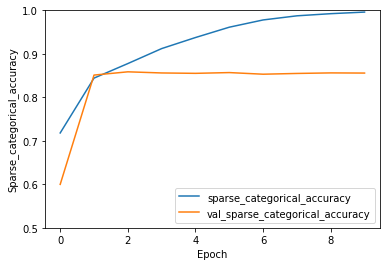

In [9]:
image_batch, label_batch = next(iter(train_dataset))

history = model.fit(train_dataset,  
                    epochs=10, 
                    validation_data=valid_dataset)

plt.plot(history.history['sparse_categorical_accuracy'], label='sparse_categorical_accuracy')
plt.plot(history.history['val_sparse_categorical_accuracy'], label = 'val_sparse_categorical_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Sparse_categorical_accuracy')
plt.ylim([0.5, 1])
plt.legend(loc='lower right')

# Edges Detection
Generally, an image contains objects described by their shape and their texture. In our case, objects can be the cassadas, earth, the sky, human's foot, humain's face, shadow, etc. We call these objects **image features**. Edges of a feature are represented as a set of curved segments that describe the shape of the feature. For example, a plant's leaf is green and the earth is brown, so in terms of greyscale image, the change of intensity between the two features is significant.

The objective of the edge detection is to identify where the intensity significantly changes or in other terms, detecting the local discontinuity in the pixels intensity. These discontinuities result in 4 types of edge profiles:
- Step edges;
- Roof edges;
- Ramp edges;
- Ridge edges.

**Why** do we detect edges when processing an image? To extract the image features and their properties such as the shape. This is useful because it increase significantly the efficiency of objects recognition in images.

**When** in the process do we detect edges? This is frequently the first step to find the features in the image. This is useful to remove the features that are noisy for our purposes. For example, since we are interested by the cassadas, earth is considered noise in an image.

**How** do we detect the edges in an image? We use the **Canny edges detection algorithm**. Each of the following steps of the algorithm is explained in the next subsections:
1. Convertion of a RGB image to a greyscale image;
2. Image Smoothering;
3. Gradient calculation;
4. Non-maximum suppression;
5. Double threshold;
6. Edge tracking by hysteresis.

## Convertion of RGB Images to Greyscale Images
Since we only need to work with the pixel intensity in the edges detection, it is sufficient and simpler to work with a grayscale image. A greyscale pixel is a scalar having its value between 0 (black) and 255 (white) where 255 is the brightest value on the greyscale. Thus, we need a function $\beta : B^3 \longrightarrow B$ that converts a RGB pixel $P_{x, y}$ to a greyscale pixel $\beta(P_{x, y})$.

The conversion is proceessed by using the weighted average formula defined as
$$
\beta(P_{x, y}) = 0.299 \cdot r_{x, y} + 0.587 \cdot g_{x, y} + 0.114 \cdot b_{x, y}.
$$
For example, if a RGB pixel located at the point $(x, y)$ on an image is $P_{x, y} = (255, 47, 125)$, then 
$$
\begin{align*}
\beta((255, 47, 125)) &= 0.299 \cdot 255 + 0.587 \cdot 47 + 0.114 \cdot 125 \\
                      &= 118.084.
\end{align*}
$$

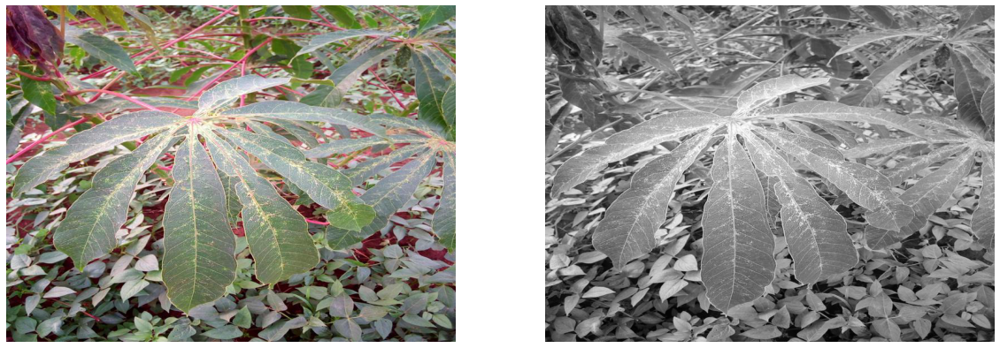

In [ ]:
def showComparedGrayscaleImages(original_image, current_image):
    fig, axes = plt.subplots(1, 2, figsize=(20, 20))
    axes[0].axis("off")
    axes[1].axis("off")
    axes[0].imshow(original_image, cmap="gray")
    axes[1].imshow(current_image, cmap="gray")
    plt.show()

random_filename = random.sample(dataset, 1)
rgb_image = Image.open("Dataset/train_images/" + random_filename[0][0])
grayscale_image = np.asarray(rgb_image.convert('L'))

fig, axes = plt.subplots(1, 2, figsize=(20, 20))
axes[0].axis("off")
axes[1].axis("off")
axes[0].imshow(rgb_image)
axes[1].imshow(grayscale_image, cmap="gray")
plt.show()

## Image Smoothing
The objective is to reduce the level of noise in an image to improve the result of the edge detection algorithm. We assume that the grayscale pixels considered as a noise in an image follow a normal law and are identically independently distributed (i.i.d). Therefore, we use the Gaussian blur method to smooth the image.

Let $K \in M_{2n + 1}([0, 1])$ be the Gaussian kernel represented by a square matrix of size $2n + 1$. We represent the kernel $K$ as
$$
K = \begin{bmatrix} 
          k_{1, 1} & k_{1, 2} & \ldots & k_{1, 2n + 1} \\ 
          k_{2, 1} & k_{2, 2} & \ldots & k_{2, 2n + 1} \\ 
          \vdots & \vdots & \ddots & \vdots \\
          k_{2n + 1, 1} & k_{2n + 1, 2} & \ldots & k_{2n + 1, 2n + 1}
      \end{bmatrix}
$$
where every value in $K$ are represented by the 2D-Gaussian function
$$
k_{i, j} = \frac{1}{2\pi \sigma^2} \exp{\left(-\frac{(i - (n + 1))^2 + (j - (n + 1))^2}{2\sigma^2}\right)}
$$
for $1 \leq i, j \leq 2n + 1$. The input parameters that have to be provided in order to obtain the gaussian kernel $K$ are the standard deviation $\sigma \neq 0$ and the kernel size $2n + 1 \geq 1$.

However, the sum of values in $K$ is different than $1$. This will cause a darkening or brightening of the image. To prevent that, we have to normalize the kernel in order to obtain the sum of all values in $K$ equal to $1$. To do so, we have to divide all values in $K$ by:
$$
N = \sum\limits_{i = 1}^{2n+1} \sum\limits_{j = 1}^{2n+1} k_{i, j}.
$$
Therefore, if $K_{i, j} = \frac{k_{i, j}}{N}$ for all $i, j$, then we obtain
$$
\sum\limits_{i = 1}^{2n+1} \sum\limits_{j = 1}^{2n+1} K_{i, j} = 1.
$$

After discretizing, pixels with a distance greater than $3\sigma$ have negligible weights. Hence, we set the kernel size $2n - 1 = \lceil 3\sigma \rceil$. The size is an odd integer because we place the kernel centre over each value of the matrix $\beta(I)$.

In [ ]:
# The kernel size should be an odd integer.
def gaussian_kernel(kernel_size, sigma=1):
    size = np.linspace(-(kernel_size - 1) / 2., (kernel_size - 1) / 2., kernel_size)
    x, y = np.meshgrid(size, size)

    coefficient = 1 / (2.0 * np.pi * np.square(sigma))
    kernel =  np.exp(-((np.square(x) + np.square(y)) / (2.0*np.square(sigma)))) * coefficient
    
    return kernel / np.sum(kernel)

kernel = gaussian_kernel(5, 1.4)
print(kernel)

[[0.01214612 0.02610994 0.03369732 0.02610994 0.01214612]
 [0.02610994 0.0561273  0.07243752 0.0561273  0.02610994]
 [0.03369732 0.07243752 0.09348738 0.07243752 0.03369732]
 [0.02610994 0.0561273  0.07243752 0.0561273  0.02610994]
 [0.01214612 0.02610994 0.03369732 0.02610994 0.01214612]]


To smooth a grayscale image $\beta(I)$, we have to convolve it with the gaussian kernel $K$. The convolution operator noted $*$ takes a grayscale image $\beta(I)$ and a gaussian kernel $K$ as input parameters. The centre value of $K$ is placed over each value of $\beta(I)$ when projecting the kernel over the grayscale image.

For example, if the kernel is a $3 \times 3$ matrix defined by:
$$
K = \begin{bmatrix} 
          k_{1, 1} & k_{1, 2} & k_{1, 3} \\ 
          k_{2, 1} & k_{2, 2} & k_{2, 3} \\ 
          k_{3, 1} & k_{3, 2} & k_{3, 3}
      \end{bmatrix}
$$
and the grayscale image is a $5 \times 5$ matrix defined by:
$$
\beta(I) = \begin{bmatrix} 
          \beta(P_{1, 1}) & \beta(P_{1, 2}) & \beta(P_{1, 3}) & \beta(P_{1, 4}) & \beta(P_{1, 5}) \\ 
          \beta(P_{2, 1}) & \beta(P_{2, 2}) & \beta(P_{2, 3}) & \beta(P_{2, 4}) & \beta(P_{2, 5}) \\
          \beta(P_{3, 1}) & \beta(P_{3, 2}) & \beta(P_{3, 3}) & \beta(P_{3, 4}) & \beta(P_{3, 5}) \\
          \beta(P_{4, 1}) & \beta(P_{4, 2}) & \beta(P_{4, 3}) & \beta(P_{4, 4}) & \beta(P_{4, 5}) \\
          \beta(P_{5, 1}) & \beta(P_{5, 2}) & \beta(P_{5, 3}) & \beta(P_{5, 4}) & \beta(P_{5, 5}) 
      \end{bmatrix}
$$
then the convolution result is noted $S$ (for **S**mooth):
$$
\beta(I) * K = S = \begin{bmatrix} 
          s_{1, 1} & s_{1, 2} & s_{1, 3} & s_{1, 4} & s_{1, 5} \\ 
          s_{2, 1} & s_{2, 2} & s_{2, 3} & s_{2, 4} & s_{2, 5} \\
          s_{3, 1} & s_{3, 2} & s_{3, 3} & s_{3, 4} & s_{3, 5} \\
          s_{4, 1} & s_{4, 2} & s_{4, 3} & s_{4, 4} & s_{4, 5} \\
          s_{5, 1} & s_{5, 2} & s_{5, 3} & s_{5, 4} & s_{5, 5}
      \end{bmatrix}
$$
To calculate $s_{1, 1}$, the matrix $K$ is placed over the matrix $\beta(I)$ such that the centre of $K$, which is $k_{2, 2}$, is over $\beta(P_{1, 1})$. Therefore, $s_{1, 1}$ is calculate the following way:
$$
\beta(P_{0, 0}) \cdot k_{1, 1} + \beta(P_{0, 1}) \cdot k_{1, 2} + \beta(P_{0, 2}) \cdot k_{1, 3} + \\
\beta(P_{1, 0}) \cdot k_{2, 1} + \beta(P_{1, 1}) \cdot k_{2, 2} + \beta(P_{1, 2}) \cdot k_{2, 3} + \\
\beta(P_{2, 0}) \cdot k_{3, 1} + \beta(P_{2, 1}) \cdot k_{3, 2} + \beta(P_{2, 2}) \cdot k_{3, 3}.
$$
However, the pixels out of the image (e.g. row and column $0$) do not exist. Then, we take the value $0$ for those pixels. With a kernel of size $2n + 1$, we generalize the formula to:
$$
s_{x, y} = \sum\limits_{i = 1}^{2n + 1} \sum\limits_{j = 1}^{2n + 1} \beta(P_{x - n + i - 1, y - n + j - 1}) \cdot k_{i, j}
$$
for $x \leq w$ and $y \leq h$.

**Example**

Let
$$
K = \begin{bmatrix} 
        1 & 2 & 1 \\ 
        2 & 4 & 2 \\ 
        1 & 2 & 1
    \end{bmatrix}
$$
and
$$
\beta(I) = \begin{bmatrix} 
                30 & 17 & 98 & 111 \\ 
                6 & 177 & 101 & 121 \\ 
                204 & 77 & 195 & 193 \\
                154 & 154 & 161 & 160
            \end{bmatrix}
$$
The centre value of $K$ is $k_{2, 2} = 4$. To find $s_{1, 1}$, we place $K$ over $\beta(I)$ such that the centre value $4$ is over $\beta(P_{1, 1}) = 30$. This gives
$$
\begin{align*}
    s_{1, 1} &= \begin{aligned}[t]
        &\beta(P_{0, 0}) \cdot k_{1, 1} + \beta(P_{0, 1}) \cdot k_{1, 2} + \beta(P_{0, 2}) \cdot k_{1, 3} + \\
        &\beta(P_{1, 0}) \cdot k_{2, 1} + \beta(P_{1, 1}) \cdot k_{2, 2} + \beta(P_{1, 2}) \cdot k_{2, 3} + \\
        &\beta(P_{2, 0}) \cdot k_{3, 1} + \beta(P_{2, 1}) \cdot k_{3, 2} + \beta(P_{2, 2}) \cdot k_{3, 3}
    \end{aligned} \\
    &= \begin{aligned}[t]
        &0 \cdot 1 + 0 \cdot 2 + 0 \cdot 1 + \\
        &0 \cdot 2 + 30 \cdot 4 + 17 \cdot 2 + \\
        &0 \cdot 1 + 6 \cdot 2 + 177 \cdot 1
    \end{aligned} \\
    &= 343.
\end{align*}
$$
Then, the centre of $K$ is moved over $\beta(P_{1, 2})$ to calculate $s_{1, 2}$.

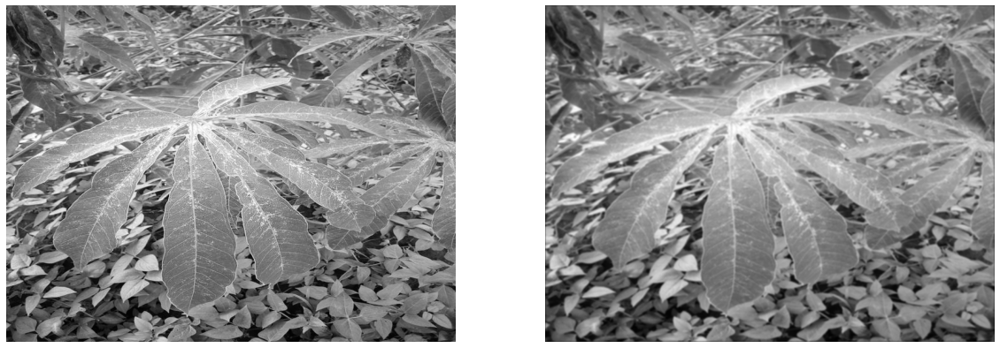

In [ ]:
def convolution2d(image, kernel):
    kernel_dim = kernel.shape[0]
    height, width = image.shape
    height = height - kernel_dim + 1
    width = width - kernel_dim + 1
    new_image = np.zeros((height, width))
    for y in range(height):
        for x in range(width):
            new_image[y][x] = np.sum(image[y:y+kernel_dim, x:x+kernel_dim] * kernel)
    return new_image

import scipy.signal as sig
convolved_image = sig.convolve2d(grayscale_image, kernel, mode="same")
showComparedGrayscaleImages(grayscale_image, convolved_image)

#convolved_image = convolution2d(grayscale_image, kernel)
#showComparedGrayscaleImages(grayscale_image, convolved_image)

## Gradient Image Calculation
The objective of using the gradient image calculation is to measure the change in intensity of any points in the smoothered grayscale image. A gradient image in the $x$ direction measures the horizontal changes in intensity while a gradient image in the $y$ direction measures the vertical changes in intensity. Therefore, the main idea is to find the edges curve and their direction.

Pixels having similar intensity give a low gradient magnitude among those pixels. We define the gradient of the smoothered image $S$ at the point $(x, y)$ as
$$
\nabla S(x, y) = \left(\frac{\partial S(x,y)}{\partial x}, \frac{\partial S(x,y)}{\partial y}\right).
$$

By definition of the derivative, we have that:
$$
\begin{gather}
\frac{\partial \beta(x,y)}{\partial x} = \lim\limits_{h \rightarrow 0} \frac{\beta(x + h, y) - \beta(x, y)}{h} \\
\frac{\partial \beta(x,y)}{\partial y} = \lim\limits_{h \rightarrow 0} \frac{\beta(x, y + h) - \beta(x, y)}{h}.
\end{gather}
$$
We use the centered finite difference approximation (it uses the right and left neighbors for $x$ and up and bottom neighbors for $y$) to estimate the image gradient with:
$$
\begin{gather}
\frac{\partial S(x,y)}{\partial x} \approx \frac{S(x + 1, y) - S(x - 1, y)}{2} \\
\frac{\partial S(x,y)}{\partial y} \approx \frac{S(x, y + 1) - S(x, y - 1)}{2}.
\end{gather}
$$
At the left boundaries of the image $S$, the image gradient is estimated with:
$$
\begin{gather}
\frac{\partial S(x,y)}{\partial x} \approx S(x + 1, y) - S(x, y) \\
\frac{\partial S(x,y)}{\partial y} \approx S(x, y + 1) - S(x, y).
\end{gather}
$$
At the right boundaries of the image $S$, the image gradient is estimated with:
$$
\begin{gather}
\frac{\partial S(x,y)}{\partial x} \approx S(x, y) - S(x - 1, y) \\
\frac{\partial S(x,y)}{\partial y} \approx S(x, y) - S(x, y - 1).
\end{gather}
$$

**Gradient Magnitude and Direction**

The gradient magnitude measuring the edge strength is defined by the distance between the origin point $(0, 0)$ and the smoothered image gradient $\nabla S(x, y)$:
$$
||\nabla S(x, y)|| = \sqrt{\left(\frac{\partial S(x,y)}{\partial x}\right)^2 + \left(\frac{\partial S(x,y)}{\partial y}\right)^2}.
$$
Having sharp transition in pixel intensities results in high gradient magnitudes, and the boundaries correspond to edges we want to find. From that distance, we deduce the length of opposite side of the rectangle triangle as $\frac{\partial S(x,y)}{\partial y}$ and the adjacent side as $\frac{\partial S(x,y)}{\partial x}$. In virtue of the trigonometric properties in a rectangle triangle, we obtain:
$$
\tan \theta = \frac{\frac{\partial S(x,y)}{\partial y}}{\frac{\partial S(x,y)}{\partial x}}
$$
or equivalently the gradient direction angle (orientation of the edge normal) 
$$
\theta = \arctan \frac{\frac{\partial S(x,y)}{\partial y}}{\frac{\partial S(x,y)}{\partial x}}.
$$

**Example**

If we want to find $\nabla S(2, 2)$ and its gradient magnitude with the following grayscale smooth pixels:
- $S(1, 2) = 50$
- $S(3, 2) = 75$
- $S(2, 1) = 65$
- $S(2, 3) = 60$

then we obtain
$$
\begin{align*}
\frac{\partial S(2, 2)}{\partial x} &\approx \frac{S(3, 2) - S(1, 2)}{2} \\
&= \frac{75 - 50}{2} \\
&= 12.5
\end{align*}
$$
and 
$$
\begin{align*}
\frac{\partial S(2, 2)}{\partial y} &\approx \frac{S(2, 3) - S(2, 1)}{2} \\
&= \frac{60 - 65}{2} \\
&= -2.5.
\end{align*}
$$
It follows that 
$$
||\nabla S(2, 2)|| = \sqrt{12.5^2 + (-2.5)^2} = 12.7475
$$
and
$$
\theta = \arctan \frac{-2.5}{12.5} = -0.1974 = -11.31°.
$$

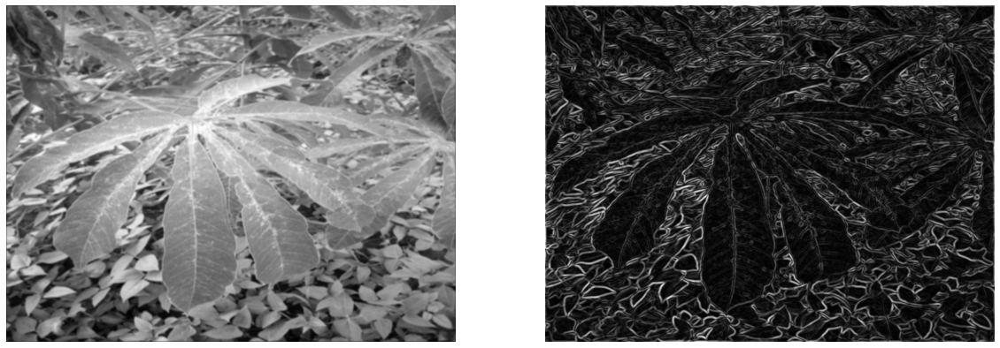

In [ ]:
## Obtain the image gradient in x-axis (first array) and y-axis (second array).
def GradientMagnitudeAndDirections(image):
    image_gradient = np.gradient(image)
    gradient_x = image_gradient[0]
    gradient_y = image_gradient[1]

    gradient_magnitude = np.hypot(gradient_x, gradient_y)
    direction_angles = np.arctan2(gradient_y, gradient_x) + np.pi

    return (gradient_magnitude, direction_angles)

gradient_magnitude, direction_angles = GradientMagnitudeAndDirections(convolved_image)
showComparedGrayscaleImages(convolved_image, gradient_magnitude)

## Non-Maximum Suppression
By filtering with Gaussian, we smoothered the original grayscale image. Then, we apply the gradient magnitude on the smoothered image which reduced the influence of noise within the image. However, this introduced a drawback that the edges in the image are no longer single-pixel, but become a thick region due to the smoothing effect.

The objective is to reduce the edges region (multiple-pixel curves) into single-pixel curves. Thus, we need to keep only the local maxima pixels and discard non-maxima pixels in an edge region, resulting thiner, and ideally single-pixel, edges.

The local maxima pixels are pixels showing the highest gradient magnitude locally.

Let $M$ be the image obtained from the matrix of gradient magnitudes where 
$$
M(x, y) = ||\nabla S(x, y)||
$$
for all points $(x, y)$ of a gradient magnitude image $M$. In order to suppress the non-maximum pixels of $M$, we need to compare the pixel gradient magnitude at point $(x, y)$ with its neighbors and keep the maximum of the gradient magnitude. 

Let $\Theta(x, y)$ be the direction angle associated with gradient magnitude $M(x, y)$ at the point $(x, y)$. To determine with which neighbors $M(x, y)$ has to be compared, we have to know if the direction goes horizontally, vertically or diagonally. We use the direction angle $\Theta(x, y) \in ]-\pi, \pi]$. In order to get the angles between $0$ and $2\pi$, we have to add $\pi$ to $\Theta$:
$$
\Theta(x, y) \leftarrow \Theta(x, y) + \pi
$$
For the directions, we have 4 cases that determine the 2 neighbors (noted $n_l$ for the left neighbor and $n_r$ for the right neighbor) from the **direction normal**:
$$
(n_l, n_r) = 
\begin{cases}
    (M(x, y - 1), M(x, y + 1)),& \text{if } 0 \leq \Theta(x, y) < \frac{\pi}{8} \text{ or } \frac{15\pi}{8} \leq \Theta(x, y) < 2\pi \\
    (M(x - 1, y + 1), M(x + 1, y - 1)),& \text{if } \frac{\pi}{8} \leq \Theta(x, y) < \frac{3\pi}{8} \text{ or } \frac{9\pi}{8} \leq \Theta(x, y) < \frac{11\pi}{8} \\
    (M(x - 1, y), M(x + 1, y)),& \text{if } \frac{3\pi}{8} \leq \Theta(x, y) < \frac{5\pi}{8} \text{ or } \frac{11\pi}{8} \leq \Theta(x, y) < \frac{13\pi}{8} \\
    (M(x + 1, y + 1), M(x - 1, y - 1)),& \text{if } \frac{5\pi}{8} \leq \Theta(x, y) < \frac{7\pi}{8} \text{ or } \frac{13\pi}{8} \leq \Theta(x, y) < \frac{15\pi}{8}.
\end{cases}
$$

For each point $(x, y)$ of $M$, if $n_l$ and $n_r$ are the 2 neighbors of $M(x, y)$, then:
$$
M_{max}(x, y) =
\begin{cases}
    M(x, y),& \text{if } M(x, y) \geq \max (n_l, n_r) \\
    0,& \text{if } M(x, y) < \max (n_l, n_r).
\end{cases}
$$

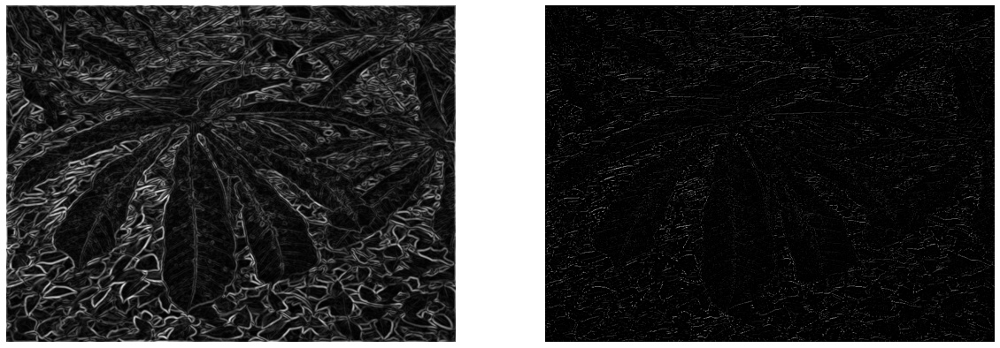

In [ ]:
# image represents the matrix M and theta represents the matrix Theta.
def nonMaximumSuppression(image, angle):
    image_max = np.zeros(image.shape)
    PI_OVER_8 = np.pi / 8

    for y in range(1, image.shape[0] - 1):
        for x in range(1, image.shape[1] - 1):              
            # Angles 0 and 360
            if (0 <= angle[y, x] < PI_OVER_8) or (15 * PI_OVER_8 <= angle[y, x] <= 2 * np.pi):
                right_neighbor = image[y, x + 1]
                left_neighbor = image[y, x - 1]

            # Angles 45 and 225
            elif (PI_OVER_8 <= angle[y, x] < 3 * PI_OVER_8) or (9 * PI_OVER_8 <= angle[y, x] <= 11 * PI_OVER_8):
                right_neighbor = image[y + 1, x - 1]
                left_neighbor = image[y - 1, x + 1]

            # Angles 90 and 270
            elif (3 * PI_OVER_8 <= angle[y, x] < 5 * PI_OVER_8) or (11 * PI_OVER_8 <= angle[y, x] <= 13 * PI_OVER_8):
                right_neighbor = image[y + 1, x]
                left_neighbor = image[y - 1, x]

            # Angles 135 and 315
            else:
                right_neighbor = image[y - 1, x - 1]
                left_neighbor = image[y + 1, x + 1]

            if image[y, x] >= max(right_neighbor, left_neighbor):
                image_max[y, x] = image[y, x]
    
    return image_max

image_max = nonMaximumSuppression(gradient_magnitude, direction_angles)
showComparedGrayscaleImages(gradient_magnitude, image_max)

## Double Thresholds
The edge pixels remaining after the non-maximum suppression step are (still) marked with their strength. Many of these will probably be true edges in the image, but some maybe caused by noise or color variations for instance due to rough surfaces. The simplest way to discern between these would be to use a threshold, so that only stronger edges would be preserved.

The objective is to classify those pixels by their following strength:
- Strong pixels;
- Weak pixels;
- Non-relevent pixels.

This explains why there is a low threshold $t_{low}$ and a high threshold $t_{high}$ where $t_{high} > t_{low}$. We define a pixel from the image $M_{max}$ as: 
- Strong pixel (close to white) if $M_{max}(x, y) \geq t_{high}$;
- Weak pixel (gray) if $t_{low} \leq M_{max}(x, y) < t_{high}$;
- Non-relevent pixel if $M_{max}(x, y) < t_{low}$.

The non-relevent pixels are removed from the image to preserve only the stronger pixels. If we state that $100 \%$ represents the pixel with the highest intensity in the image $M_{max}$, then we can define 2 threshold percentages for both thresholds:
$$
\begin{gather}
    \rho_{i,j}_{low} = \frac{t_{low}}{\max\limits_{(x, y)}(M_{max}(x, y))} \in [0, 1] \\
    \rho_{i,j}_{high} = \frac{t_{high}}{\max\limits_{(x, y)}(M_{max}(x, y))} \in [0, 1].
\end{gather}
$$
This is more intuitive to use a percentage of white (intensity) than a value between $0$ and $255$ with a guess of the highest intensity in $M_{max}$. For example, suppose we have the following pixels:
- $M_{max}(2, 2) = 90$;
- $M_{max}(7, 4) = 225$;
- $M_{max}(56, 13) = 7$,

where $\max\limits_{(x, y)}(M_{max}(x, y)) = 240$. If we say that $\rho_{i,j}_{low} = 0.15$ (means $15 \%$) and $\rho_{i,j}_{high} = 0.4$  (means $40 \%$), then:
$$
\begin{gather}
    t_{high} = \rho_{i,j}_{high} \cdot \max\limits_{(x, y)}(M_{max}(x, y)) = 0.4 \cdot 240 = 96 \\
    t_{low} = \rho_{i,j}_{low} \cdot \max\limits_{(x, y)}(M_{max}(x, y)) = 0.15 \cdot 240 = 36.
\end{gather}
$$
Therefore, we identify that:
- $M_{max}(2, 2) = 90$ is a weak pixel because $36 \leq M_{max}(2, 2) \leq 96$.
- $M_{max}(7, 4) = 225$ is a strong pixel because $M_{max}(7, 4) \geq 96$.
- $M_{max}(56, 13) = 7$ is a non-relevent pixel because $M_{max}(2, 2) \leq 36$.

In conclusion, if we say that the white value is $255$, gray value is $50$ and black value is $0$, then we obtain:
$$
T(x, y) =
\begin{cases}
    255,& \text{if } M_{max}(x, y) \geq t_{high} \\
    50,& \text{if } t_{low} \leq M_{max}(x, y) < t_{high} \\
    0,& \text{if } M_{max}(x, y) < t_{low}
\end{cases}
$$
where $T(x, y)$ is the resulting image after applying the thresholds.

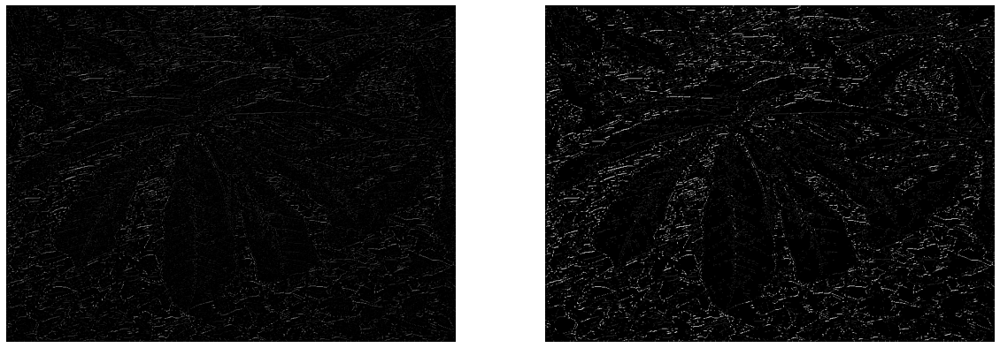

In [ ]:
def keepWeakAndStrongPixels(image, threshold_ratio_low, threshold_ratio_high):
    max_pixel_intensity = image.max()
    threshold_high = max_pixel_intensity * threshold_ratio_high;
    threshold_low = max_pixel_intensity * threshold_ratio_low;

    image_stronger_pixels = np.zeros(image.shape)

    strong_y, strong_x = np.where(image > threshold_high)
    weak_y, weak_x = np.where((image <= threshold_high) & (image >= threshold_low))

    image_stronger_pixels[strong_y, strong_x] = np.int32(255)
    image_stronger_pixels[weak_y, weak_x] = np.int32(50)

    return image_stronger_pixels

image_stronger_pixels = keepWeakAndStrongPixels(image_max, 0.1, 0.3)
showComparedGrayscaleImages(image_max, image_stronger_pixels)

## Edge Tracking by Hysteresis
We know that strong pixels are included in the final image without any other processing. However, weak pixels can either be due to true edges or noise/color variations. The objective is to convert the weak pixels to strong pixels if and only if they are connected to at least a strong pixel. The weak pixels that are not connected to a strong pixel have to be removed from the image.

In order to know if a weak pixel located at the point $(x, y)$ is connected to at least a strong pixel, we have to verify if at least one of the $8$ neighbors of the point $(x, y)$ is a strong pixel. If the point $(x, y)$ is the centre point of a $3 \times 3$ grid, then the $8$ neighbors are:
- $T(x - 1, y - 1)$
- $T(x, y - 1)$
- $T(x + 1, y - 1)$
- $T(x + 1, y)$
- $T(x + 1, y + 1)$
- $T(x, y + 1)$
- $T(x - 1, y + 1)$
- $T(x - 1, y)$

Let $\mathcal{N}(x, y)$ be the set of these $8$ neighbors of $T(x, y)$ and let $T(x', y') \in \mathcal{N}(x, y)$. Therefore:
$$
E(x, y) =
\begin{cases}
    255,& \text{if } T(x, y) = 25 \text{ and } T(x', y') = 255 \\
    255,& \text{if } T(x, y) = 255 \\
    0,& \text{otherwise } 
\end{cases}
$$
where $E$ is the final image containing the edges.

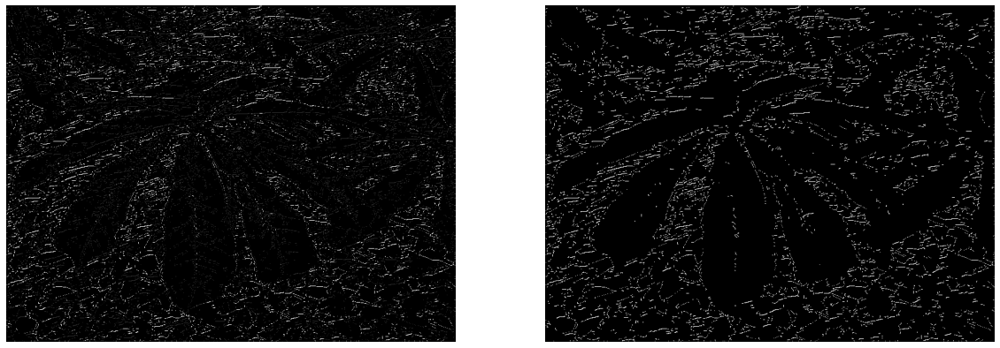

In [ ]:
def checkForConnectedStrongPixels(final_image, y, x):
    weak = np.int32(50)
    strong = np.int32(255)

    if final_image[y, x] == weak:
        if ((final_image[y+1, x-1] == strong) or (final_image[y+1, x] == strong) 
            or (final_image[y+1, x+1] == strong) or (final_image[y, x-1] == strong) 
            or (final_image[y, x+1] == strong) or (final_image[y-1, x-1] == strong) 
            or (final_image[y-1, x] == strong) or (final_image[y-1, x+1] == strong)):
            final_image[y, x] = strong
        else:
            final_image[y, x] = 0

def applyTrackingByHysteresis(image):
    top = image.copy()

    for y in range(1, image.shape[0]):
        for x in range(1, image.shape[1]):
            checkForConnectedStrongPixels(top, y, x)

    bottom = image.copy()
    for y in range(image.shape[0] - 1, 0, -1):
        for x in range(image.shape[1] - 1, 0, -1):
            checkForConnectedStrongPixels(bottom, y, x)

    right = image.copy()
    for y in range(1, image.shape[0]):
        for x in range(image.shape[1] - 1, 0, -1):
            checkForConnectedStrongPixels(right, y, x)

    left = image.copy()
    for y in range(image.shape[0] - 1, 0, -1):
        for x in range(1, image.shape[1]):
            checkForConnectedStrongPixels(left, y, x)

    final_image = top + bottom + right + left
    final_image[final_image > 255] = 255

    return final_image

final_image = applyTrackingByHysteresis(image_stronger_pixels)
showComparedGrayscaleImages(image_stronger_pixels, final_image)

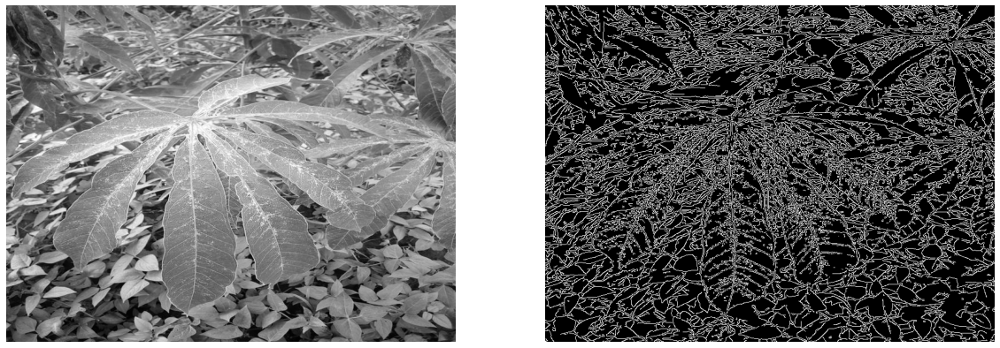

In [ ]:
import cv2 as cv

image_median = np.median(grayscale_image)
sigma = 0.33

lower = int(max(0, (1.0 - sigma) * image_median))
upper = int(min(255, (1.0 + sigma) * image_median))

image_edges = cv.Canny(grayscale_image, lower, upper)
showComparedGrayscaleImages(grayscale_image, image_edges)